# Viscous Burgers Equation (Forward mode auto diff)

## Maping viscosity space to the solution space

$$ \frac{ds}{dt} + s \frac{ds}{dx} = \nu \frac{d^2s}{dx^2}$$

$$ s(x,0) = u(x), x \in (0,1),$$

$$ s(0,t) = s(1,t), $$

$$ \frac{ds(0,t)}{dx} = \frac{ds(1,t)}{dx},$$

In [1]:
from flax import linen as nn
from typing import Sequence, Tuple
import jax
import jax.numpy as jnp
from torch.utils import data
from functools import partial
import time
import optax
import scipy.io
import os
import argparse
import matplotlib.pyplot as plt
import shutil
import pandas as pd
from jax import jvp
import pickle
from sklearn import metrics
from termcolor import colored
import random
import numpy as np
import matplotlib.gridspec as gridspec

# Inputs

In [2]:
## All inputs

path = os.path.join(os.getcwd(), './Burgers_1000_nu_d1.mat')  # Please use the matlab script to generate data

n_train = 900
p_data_train = 300
p_res_train = 2500
batch_size = 450
n_test = 101
n_sensors = p_data_train #101*101
branch_layers = [64, 64, 64]
branch_nu_layers = [64, 64, 64]
branch_input_features = 1
trunk_layers = [64, 64, 64]
trunk_input_features = 2
hidden_dim = 100
hidden_dim_nu = 1
p_test = 101
result_dir = './'
epochs = 80000
vis_iter = 1000
lr = 1e-3
transition_steps = 2000
decay_rate = 0.9


In [3]:
data_ref = scipy.io.loadmat(path)
u_sol_train = jnp.array(data_ref['output_train_u'])

ic_and_nu_train = jnp.array(data_ref['input_train_u0_nu'])

nu_train = ic_and_nu_train[:,-1]
# nu_train = ic_and_nu_train[:,-1]

u_sol_test = jnp.array(data_ref['output_test_u'])

ic_and_nu_test = jnp.array(data_ref['input_test_u0_nu'])
nu_test = ic_and_nu_test[:,-1]
# nu_test = ic_and_nu_test[:,-1]

print("output_train: ", str(u_sol_train.shape))   # (n_train, nt, nx)
print("nu_train: ", str(nu_train.shape))  # (n_train,)
print("output_test: ", str(u_sol_test.shape))  # (n_test, nt, nx)
print("nu_test: ", str(nu_test.shape)) # (n_test,)

output_train:  (900, 101, 101)
nu_train:  (900,)
output_test:  (100, 101, 101)
nu_test:  (100,)


(101, 101)


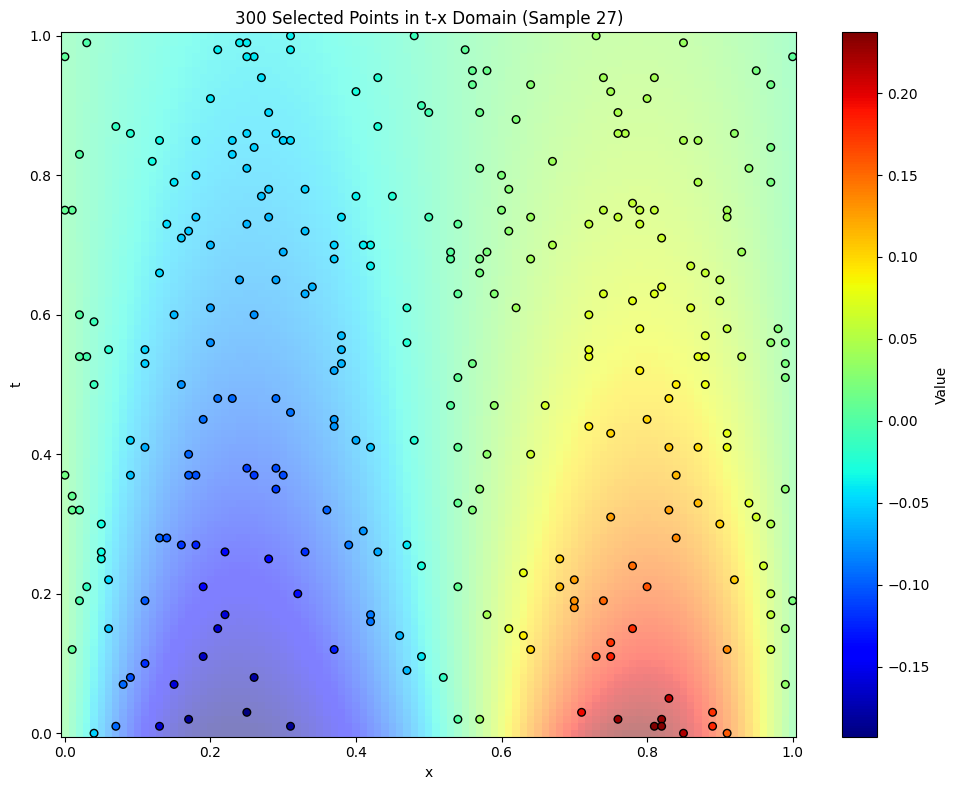

In [4]:
def extract_points(data, num_points=300):
    seed = 0
    key = jax.random.PRNGKey(seed)
    samples, ntt, nxx = data.shape
    flattened_data = data.reshape(samples, ntt * nxx)
    random_indices = jax.random.choice(key, ntt * nxx, shape=(num_points,), replace=False)
    t_indices = random_indices // ntt
    x_indices = random_indices % nxx
    t = t_indices / (ntt - 1)
    x = x_indices / (nxx - 1)
    
    # Create y array with (t, x) coordinates
    location = jnp.stack([t, x], axis=-1)
    
    # Create a grid representing the original domain
    tt = np.linspace(0, 1, ntt) 
    xx = np.linspace(0, 1, nxx)
    XX, TT = jnp.meshgrid(xx, tt, indexing='ij')
    
    y_test = jnp.stack([TT.flatten(), XX.flatten()], axis=-1)
    
    # Sample s values from u_data
    extracted_data = data[:,t_indices, x_indices]
    
    return extracted_data, location, y_test

# Extract 300 points from each sample
data_output, location_test, y_test = extract_points(u_sol_test, p_data_train)

# Choose a sample to plot (e.g., the first sample)
sample_index = 27

# Create the plot
plt.figure(figsize=(10, 8))

# Create a grid representing the original domain
t = np.linspace(0, 1, 101)
x = np.linspace(0, 1, 101)
X, T = jnp.meshgrid(x, t, indexing='ij')

print(u_sol_test[sample_index].shape)
# Plot the full domain as a light background
plt.pcolormesh(X, T, u_sol_test[sample_index,:,:].T, cmap='jet', alpha=0.5)

# Get the coordinates of the selected points
# selected_t, selected_x = np.unravel_index(selected_indices, (101, 101))
selected_values = data_output[sample_index]

# Plot the selected points
scatter = plt.scatter(location_test[:,1], location_test[:,0], c=selected_values, cmap='jet', s=30, edgecolor='black')

plt.colorbar(scatter, label='Value')
plt.title(f'{p_data_train} Selected Points in t-x Domain (Sample {sample_index})')
plt.xlabel('x')
plt.ylabel('t')

plt.tight_layout()
plt.show()

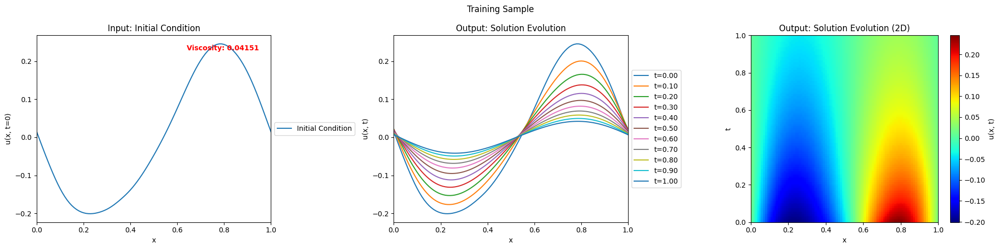

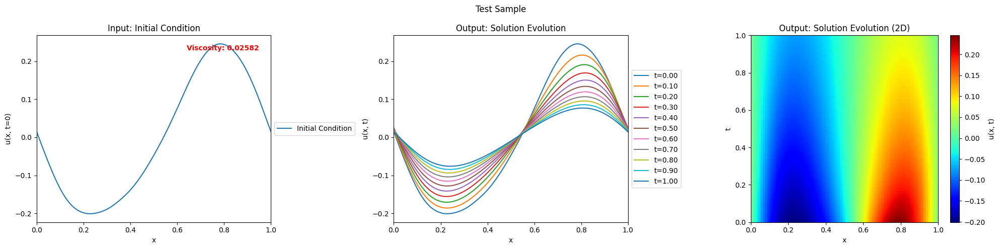

In [5]:
# Function to plot input and output for a single sample
def plot_sample(ic_and_nu, u_sol, sample_index, title):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
    fig.suptitle(title)

    # Create x and t arrays for the physical domain
    x = np.linspace(0, 1, ic_and_nu.shape[1] - 1)
    t = np.linspace(0, 1, u_sol.shape[1])
    
    XX, TT = jnp.meshgrid(x, t, indexing='ij')
    
    # Plot input
    ax1.plot(x, ic_and_nu[sample_index, :-1], label='Initial Condition')
    ax1.set_title('Input: Initial Condition')
    ax1.set_xlabel('x')
    ax1.set_ylabel('u(x, t=0)')
    ax1.set_xlim(0, 1)
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    # Display viscosity as text
    viscosity = ic_and_nu[sample_index, -1]
    ax1.text(0.95, 0.95, f'Viscosity: {viscosity:.5f}', 
             verticalalignment='top', horizontalalignment='right',
             transform=ax1.transAxes, color='red', fontweight='bold')

    # Plot output as line plots
    for i in range(0, u_sol.shape[1], 10):  # Plot every 10th time step
        ax2.plot(x, u_sol[sample_index, i, :], label=f't={t[i]:.2f}')
    ax2.set_title('Output: Solution Evolution')
    ax2.set_xlabel('x')
    ax2.set_ylabel('u(x, t)')
    ax2.set_xlim(0, 1)
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # Plot output as pcolor (flipped)
    im = ax3.pcolormesh(XX, TT, u_sol[sample_index, :, :].T, cmap='jet', shading='auto')
    ax3.set_title('Output: Solution Evolution (2D)')
    ax3.set_xlabel('x')
    ax3.set_ylabel('t')
    ax3.set_xlim(0, 1)
    ax3.set_ylim(0, 1)
    fig.colorbar(im, ax=ax3, label='u(x, t)')

    plt.tight_layout()
    plt.show()

# Plot a sample from the training set
train_sample_index = 201  # You can change this to view different samples
plot_sample(ic_and_nu_train, u_sol_train, train_sample_index, "Training Sample")

# Plot a sample from the test set
test_sample_index = 4  # You can change this to view different samples
plot_sample(ic_and_nu_test, u_sol_test, test_sample_index, "Test Sample")

# Optional: Save the figures
# plt.savefig('burgers_equation_visualization_with_physical_domain.png', dpi=300, bbox_inches='tight')

# Data generator class

In [6]:
# Data Generator
class DataGenerator(data.Dataset):
    def __init__(self, u, y, s, nu, batch_size, gen_key):
        self.u = u
        self.y = y
        self.s = s
        self.nu = nu
        self.N = nu.shape[0]
        self.batch_size = batch_size
        self.key = gen_key

    def __getitem__(self, index):
        """Generate one batch of data"""
        self.key, subkey = jax.random.split(self.key)
        inputs, outputs, nu = self.__data_generation(subkey)
        return inputs, outputs, nu

    @partial(jax.jit, static_argnums=(0,))
    def __data_generation(self, key_i):
        """Generates data containing batch_size samples"""
        idx = jax.random.choice(key_i, self.N, (self.batch_size,), replace=False)
        s = self.s[idx, :]
        y = self.y[:, :]
        u = self.u[idx, :]
        nu = self.nu[idx]
        # Construct batch
        inputs = (u, y)
        outputs = s
        return inputs, outputs, nu

# Data generation for each samples

In [7]:
def generate_random_data_points(nu_train_i, u_sol_train_i, key, num_points=300):
    
    # Generate random indices for sampling points
    num_t, num_x = u_sol_train_i.shape
    total_points = num_t * num_x
    random_indices = jax.random.choice(key, total_points, shape=(num_points,), replace=False)
    
    # Calculate t and x coordinates for the sampled points
    t_indices = random_indices // num_x
    x_indices = random_indices % num_x
    t = t_indices / (num_t - 1)
    x = x_indices / (num_x - 1)
    
    # Create a grid representing the original domain
    tt = jnp.linspace(0, 1, 101)
    xx = jnp.linspace(0, 1, 101)
    XX, TT = jnp.meshgrid(xx, tt, indexing='ij')
    
    y = jnp.stack([TT.flatten(), XX.flatten()], axis=-1)
    
    # Sample s values from u_data
    u = u_sol_train_i[t_indices, x_indices]
    
    s = u_sol_train_i
    
    return u, y, s, nu_train_i

def generate_one_res_training_data(nu_train_i, u_sol_train_i, key, num_points=300, p=2500):
    
    num_t, num_x = u_sol_train_i.shape
    total_points = num_t * num_x
    random_indices = jax.random.choice(key, total_points, shape=(num_points,), replace=False)
    
    # Calculate t and x coordinates for the sampled points
    t_indices = random_indices // num_t
    x_indices = random_indices % num_x
    t = t_indices / (num_t - 1)
    x = x_indices / (num_x - 1)
    
    # Create y array with (t, x) coordinates
    p_grid = int(jnp.sqrt(p))  # sqrt to get square grid
    
    t_res_i = jax.random.uniform(key, shape=(p_grid,), minval=0, maxval=1)
    t_res_i = jnp.sort(t_res_i)  # Sort to maintain increasing order
    x_res_i = jax.random.uniform(key, shape=(p_grid,), minval=0, maxval=1)
    x_res_i = jnp.sort(x_res_i)  # Sort to maintain increasing order
    x_res, t_res = jnp.meshgrid(x_res_i, t_res_i, indexing='ij')
    
    y = jnp.stack([t_res.flatten(), x_res.flatten()], axis=-1)  # Shape: (p, 2)
    
    # Sample s values from u_data
    u = u_sol_train_i[t_indices, x_indices]
    
    s = u_sol_train_i
    
    return u, y, s, nu_train_i

# Generate ics training data corresponding to one input sample
def generate_one_ics_training_data(nu_train_i, u_sol_train_i, num_points=300):
    
    key1 = jax.random.PRNGKey(0)
    # Generate random indices for sampling points
    num_t, num_x = u_sol_train_i.shape
    total_points = num_t * num_x
    random_indices = jax.random.choice(key1, total_points, shape=(num_points,), replace=False)
    
    # Calculate t and x coordinates for the sampled points
    t_indices = random_indices // num_t
    x_indices = random_indices % num_x
    t = t_indices / (num_t - 1)
    x = x_indices / (num_x - 1)
    
    # Sample s values from u_data
    u_data = u_sol_train_i[t_indices, x_indices]
    
    nu_i = nu_train_i
    
    t_0 = jnp.zeros(u_sol_train_i.shape[0]).reshape(-1,1)
    x_0 = jnp.linspace(0, 1, u_sol_train_i.shape[1]).reshape(-1,1)
    y = jnp.hstack([t_0, x_0])
    
    s = u_sol_train_i  # Shape: (101, 101)
    
    return u_data, y, s, nu_i


# Generate bcs training data corresponding to one input sample
def generate_one_bcs_training_data(nu_train_i, u_sol_train_i, num_points=300):
    
    key1 = jax.random.PRNGKey(0)
    # Generate random indices for sampling points
    num_t, num_x = u_sol_train_i.shape
    total_points = num_t * num_x
    random_indices = jax.random.choice(key1, total_points, shape=(num_points,), replace=False)
    
    # Calculate t and x coordinates for the sampled points
    t_indices = random_indices // num_x
    x_indices = random_indices % num_x
    t = t_indices / (num_t - 1)
    x = x_indices / (num_x - 1)
    
    # Sample s values from u_data
    u_data = u_sol_train_i[t_indices, x_indices]
    
    t_bc = jnp.linspace(0, 1, u_sol_train_i.shape[0]).reshape(-1,1)
    x_bc1 = jnp.zeros((u_sol_train_i.shape[1], 1))
    x_bc2 = jnp.ones((u_sol_train_i.shape[1], 1))

    y1 = jnp.hstack([t_bc, x_bc1])  # shape = (u_sol_train_i.shape[1], 2)
    y2 = jnp.hstack([t_bc, x_bc2])  # shape = (u_sol_train_i.shape[1], 2)

    nu_i = nu_train_i
    y = jnp.hstack([y1, y2])  # shape = (u_sol_train_i.shape[1], 4)
    s = u_sol_train_i  # Shape: (101, 101)
    
    return u_data, y, s, nu_i

In [8]:
# Create test data
seed = 0
key = jax.random.PRNGKey(seed)
keys = jax.random.split(key, 6)

# known u data
u_data_train, y_data_train, s_data_train, nu_data_train = (jax.vmap(generate_random_data_points,
                                                     in_axes=(0, 0, None, None))
                                            (nu_train, u_sol_train, key, p_data_train))

print("u_data_train: ", str(u_data_train.shape))  # Expected: (N_train, 300)
print("s_data_train: ", str(s_data_train.shape))  # Expected: (N_train, 101, 101)
print("y_data_train: ", str(y_data_train.shape))  # Expected: (N_train, 300, 2)
print("nu_data_train: ", str(nu_data_train.shape))  # Expected: (N_train,)

# Residual data
# key_res = jax.random.split(keys[0], n_train)
u_res_train, y_res_train, s_res_train, nu_res_train = (jax.vmap(generate_one_res_training_data,
                                                 in_axes=(0, 0, None, None, None))
                                         (nu_train, u_sol_train, key, p_data_train, p_res_train))

print("u_res_train: ", str(u_res_train.shape)) # Expected: (N_train, 300)
print("s_res_train: ", str(s_res_train.shape))  # Expected: (N_train, 101, 101)
print("y_res_train: ", str(y_res_train.shape)) # Expected: (N_train, 2500, 2)
print("nu_res_train: ", str(nu_res_train.shape)) # Expected: (N_train, )

# ICs data
u_ics_train, y_ics_train, s_ics_train, nu_ics_train = (jax.vmap(generate_one_ics_training_data,
                                                  in_axes=(0, 0, None))
                                         (nu_train, u_sol_train, p_data_train))

print("s_ics_train: ", str(s_ics_train.shape))  # Expected: (N_train, 101, 101)
print("u_ics_train: ", str(u_ics_train.shape))  # Expected: (N_train, 300)
print("y_ics_train: ", str(y_ics_train.shape))  # Expected: (N_train, 101, 2)
print("nu_ics_train: ", str(nu_ics_train.shape))  # Expected: (N_train, )

# BCs data
# key_bcs = jax.random.split(keys[0], n_train)
u_bcs_train, y_bcs_train, s_bcs_train, nu_bcs_train = (jax.vmap(generate_one_bcs_training_data,
                                                               in_axes=(0, 0, None))
                                                    (nu_train, u_sol_train, p_data_train))

# print("s_bcs_train: ", str(s_bcs_train.shape))  # Expected: (N_train, 101, 101) #not used
print("u_bcs_train: ", str(u_bcs_train.shape))  # Expected: (N_train, 101)
print("y_bcs_train: ", str(y_bcs_train.shape))  # Expected: (N_train, 101, 4)
print("nu_bcs_train: ", str(nu_bcs_train.shape))  # Expected: (N_train,)

u_data_train:  (900, 300)
s_data_train:  (900, 101, 101)
y_data_train:  (900, 10201, 2)
nu_data_train:  (900,)
u_res_train:  (900, 300)
s_res_train:  (900, 101, 101)
y_res_train:  (900, 2500, 2)
nu_res_train:  (900,)
s_ics_train:  (900, 101, 101)
u_ics_train:  (900, 300)
y_ics_train:  (900, 101, 2)
nu_ics_train:  (900,)
u_bcs_train:  (900, 300)
y_bcs_train:  (900, 101, 4)
nu_bcs_train:  (900,)


In [9]:
# Create data generators
ics_dataset = DataGenerator(u_ics_train, y_ics_train, s_ics_train, nu_ics_train, batch_size, keys[0])
bcs_dataset = DataGenerator(u_bcs_train, y_bcs_train, s_bcs_train, nu_bcs_train, batch_size, keys[1])
data_dataset = DataGenerator(u_data_train, y_data_train, s_data_train, nu_data_train, batch_size, keys[3])
res_dataset = DataGenerator(u_res_train, y_res_train, s_res_train, nu_res_train, batch_size, keys[2])

# DeepONet class

In [10]:
# DeepONet class

class DeepONet(nn.Module):
    branch_layers: Sequence[int]
    trunk_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, branch_x, trunk_x):

        init = nn.initializers.glorot_normal()

        if branch_x.ndim == 1:
            branch_x = jnp.expand_dims(branch_x, axis=-1)

#         print("branch_x_in: ", str(branch_x.shape))
        # Branch network [batch_size, 1]
        for i, fs in enumerate(self.branch_layers[:-1]):
            branch_x = nn.Dense(fs, kernel_init=init, name=f"branch_{i}")(branch_x)
            branch_x = nn.activation.tanh(branch_x)
        branch_x = nn.Dense(self.branch_layers[-1], name=f"branch_{i+1}", kernel_init=init)(branch_x)
        #[batch_size, p]
#         print("branch_x_out: ", str(branch_x.shape))

        # Trunk network
        # [x_num, 2]
        # Ensure trunk_x has at least 2 dimensions
        if trunk_x.ndim == 1:
            trunk_x = jnp.expand_dims(trunk_x, axis=0)

#         print("trunk_x_in: ", str(trunk_x.shape))

        for i, fs in enumerate(self.trunk_layers):
            trunk_x = nn.Dense(fs, kernel_init=init, name=f"trunk_{i}")(trunk_x)
            trunk_x = nn.activation.tanh(trunk_x)

#         print("trunk_x_out: ", str(trunk_x.shape))

         # [x_num, p]

        # Compute the final output
        # Input shapes:
        # branch: [batch_size, p]
        # trunk: [x_num, p]
        # output: [batch_size, x_num]
        result = jnp.einsum('ij,kj->ik', branch_x, trunk_x)

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        result += bias

        return result

# DeepONet for nu

In [11]:
# NuNet class

class NuNet(nn.Module):
    branch_nu_layers: Sequence[int]
    output_dim: int = 1

    @nn.compact
    def __call__(self, branch_nu_x):

        init = nn.initializers.glorot_normal()

        if branch_nu_x.ndim == 1:
            branch_nu_x = jnp.expand_dims(branch_nu_x, axis=-1)

#         print("branch_x_in: ", str(branch_x.shape))
        # Branch network [batch_size, 1]
        for i, fs in enumerate(self.branch_nu_layers[:-1]):
            branch_nu_x = nn.Dense(fs, kernel_init=init, name=f"branch_nu_{i}")(branch_nu_x)
            branch_nu_x = nn.activation.relu(branch_nu_x)
        branch_nu_x = nn.Dense(self.branch_nu_layers[-1], name=f"branch_nu_{i+1}", kernel_init=init)(branch_nu_x)
        #[batch_size, p]
#         print("branch_nu_x: ", str(branch_nu_x.shape))
        
        result = jnp.sum(branch_nu_x, axis=1)
        # output: [batch_size,]     
#         print("result: ", str(result.shape))

        # Add bias
        bias = self.param('output_bias', nn.initializers.zeros, (self.output_dim,))
        result += bias

        return result

# helper functions

In [12]:
"""# Helper functions"""

@partial(jax.jit)
def mse(y_true, y_pred):
    return jnp.mean(jnp.square(y_true - y_pred))

@partial(jax.jit)
def mse_single(y_pred):
    return jnp.mean(jnp.square(y_pred))

@partial(jax.jit, static_argnums=(0,))
def apply_net(model_fn, params, branch_input, *trunk_in):
    # Define forward pass for normal DeepOnet that takes series of trunk inputs and stacks them
    if len(trunk_in) == 1:
        trunk_input = trunk_in[0]
    else:
        trunk_input = jnp.stack(trunk_in, axis=-1)
    out = model_fn(params, branch_input, trunk_input)

    # Reshape to vector for single output for easier gradient computation
    # TODO: Adapt / Check squeeze
    if out.shape[1]==1:
        out = jnp.squeeze(out, axis=1)
    return out

@partial(jax.jit, static_argnums=(0,))
def apply_net_nu(model_fn_nu, params_nu, branch_input_data):
    out = model_fn_nu(params_nu, branch_input_data)
    
    # TODO: Adapt / Check squeeze
    if out.shape[0]==1:
        out = jnp.squeeze(out, axis=0)
    return out


@partial(jax.jit, static_argnums=(0, 1, 2, 3))
def step(optimizer, loss_fn, model_fn_nu, model_fn, opt_state, params_step, ics_batch, bcs_batch, res_batch, data_batch):
    loss, gradient = jax.value_and_grad(loss_fn, argnums=2)(model_fn_nu, model_fn, params_step, ics_batch, bcs_batch, res_batch, data_batch)
    updates, opt_state = optimizer.update(gradient, opt_state)
    params_step = optax.apply_updates(params_step, updates)

    return loss, params_step, opt_state

In [13]:
"""# set the model pretrained model"""

# Initialize model and params
# make sure trunk_layers and branch_layers are lists
trunk_layers = [trunk_layers] if isinstance(trunk_layers, int) else trunk_layers

branch_layers = [branch_layers] if isinstance(branch_layers, int) else branch_layers

# add output features to trunk and branch layers
trunk_layers = trunk_layers + [hidden_dim]
branch_layers = branch_layers + [hidden_dim]

# Convert list to tuples
trunk_layers = tuple(trunk_layers)
branch_layers = tuple(branch_layers)

num_outputs = 1
model = DeepONet(branch_layers, trunk_layers, num_outputs)

# model function
model_fn = jax.jit(model.apply)

In [14]:
"""# model save function"""

def save_model_params(params, result_dir, filename='model_params.pkl'):
    if not os.path.exists(result_dir):
        os.makedirs(result_dir)

    save_path = os.path.join(result_dir, filename)
    with open(save_path, 'wb') as f:
        pickle.dump(params, f)

def load_model_params(result_dir):
    load_path = os.path.join(result_dir)
    with open(load_path, 'rb') as f:
        params = pickle.load(f)
    return params

In [15]:
save = True
params_loaded = load_model_params('./model_params_best.pkl')

print("Loaded best model parameters")

Loaded best model parameters


In [16]:
"""# Test error function"""

def loss_test_l2_error(model_fn, params, data_output, u_sol_test, return_data=False):

    x_test = jnp.linspace(0, 1, u_sol_test.shape[2])
    t_test = jnp.linspace(0, 1, u_sol_test.shape[1])

    xx_test, tt_test = jnp.meshgrid(x_test, t_test, indexing='ij')

    y = jnp.stack([tt_test.flatten(), xx_test.flatten()], axis=-1) #(101*101, 2)

    t = y[:,0]
    x = y[:,1]

    def ff_net(t, x):
        s_pred = apply_net(model_fn, params, data_output, t, x)
        return s_pred

    s_pred = ff_net(t, x)

    s_pred = s_pred.reshape(u_sol_test.shape[0], u_sol_test.shape[1], u_sol_test.shape[2])

    loss_test = mse(u_sol_test, s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(jax.vmap(l2_norm_error)(u_sol_test, s_pred))

    if return_data:
        return loss_test, l2_error, s_pred
    else:
        return loss_test, l2_error

Visualizing test sample at index 0


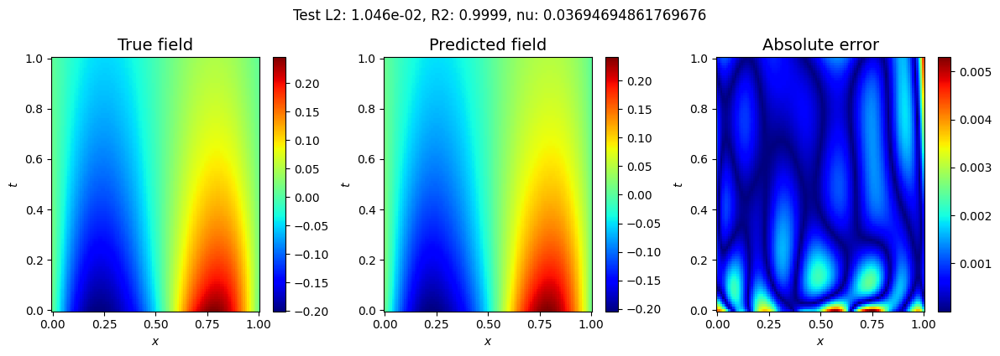

######################################################################################################################################################################################################################################
Visualizing test sample at index 10


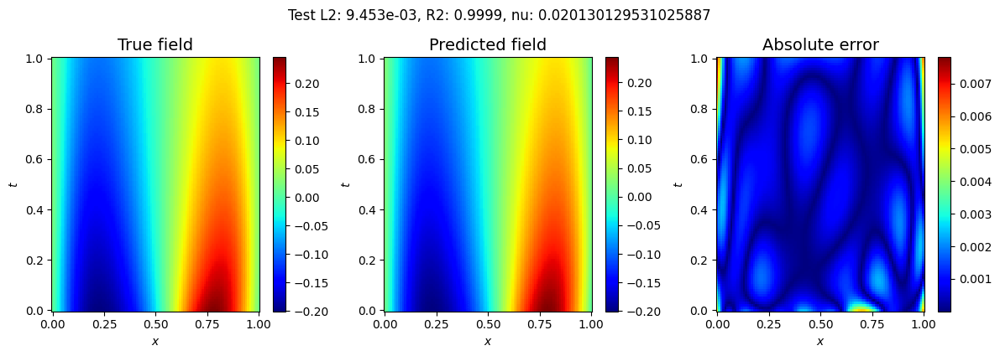

######################################################################################################################################################################################################################################
Visualizing test sample at index 20


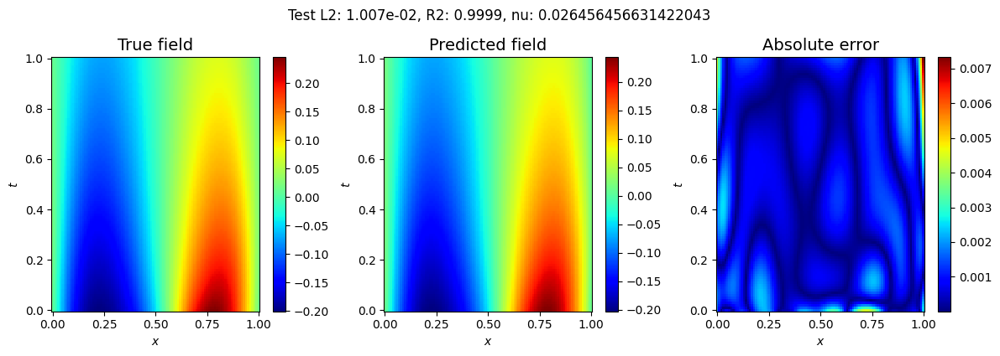

######################################################################################################################################################################################################################################
Visualizing test sample at index 30


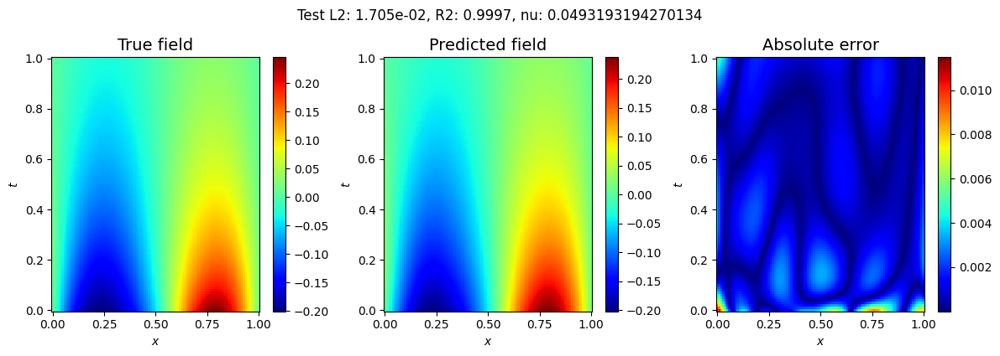

######################################################################################################################################################################################################################################
Visualizing test sample at index 40


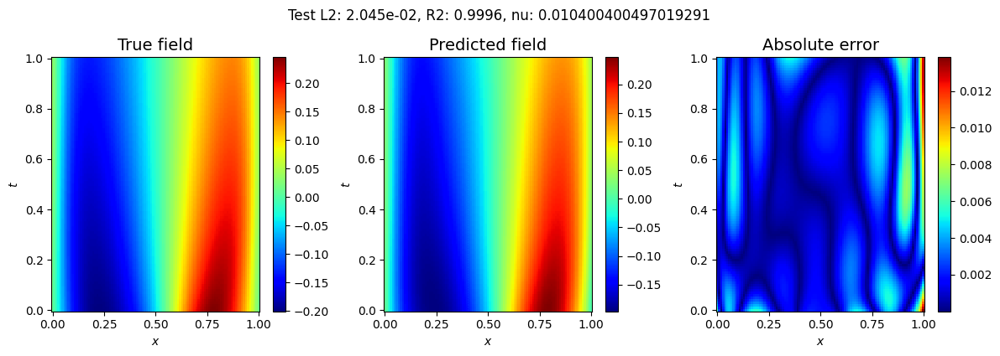

######################################################################################################################################################################################################################################
Visualizing test sample at index 50


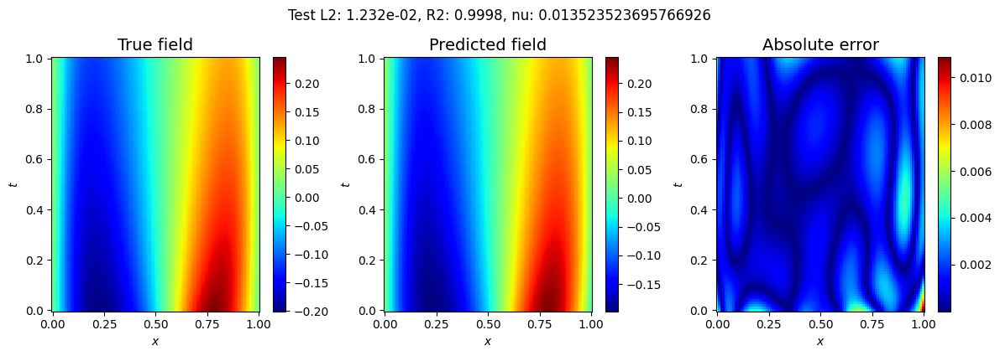

######################################################################################################################################################################################################################################
Visualizing test sample at index 60


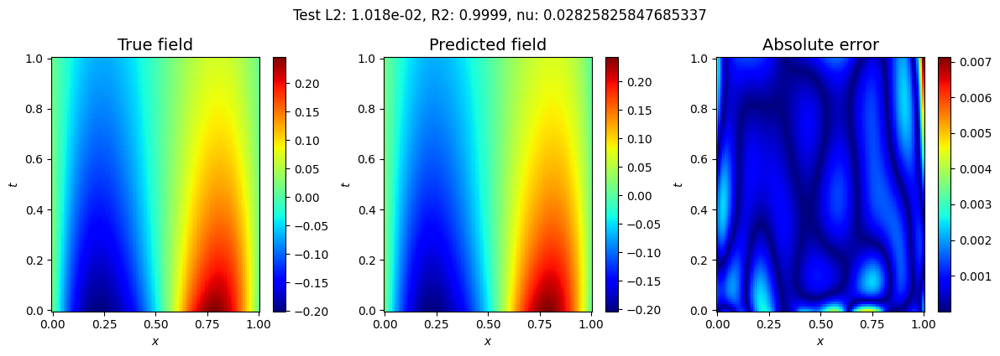

######################################################################################################################################################################################################################################
Visualizing test sample at index 70


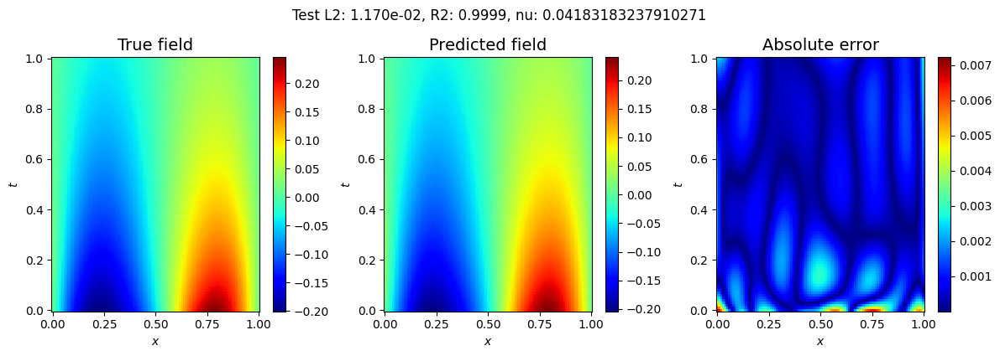

######################################################################################################################################################################################################################################
Visualizing test sample at index 80


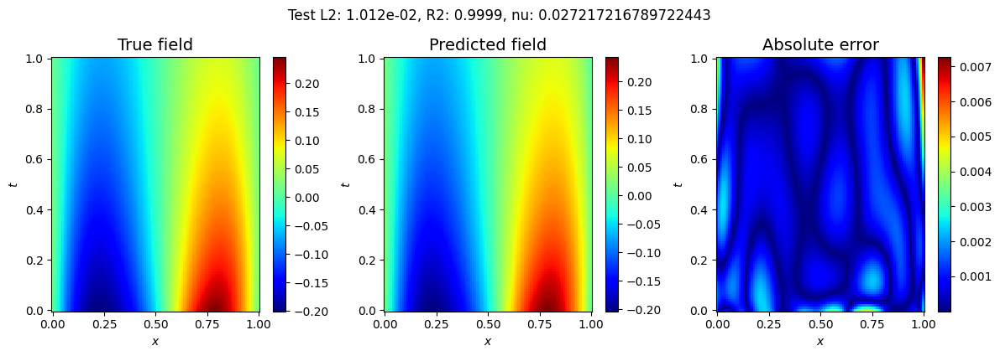

######################################################################################################################################################################################################################################
Visualizing test sample at index 90


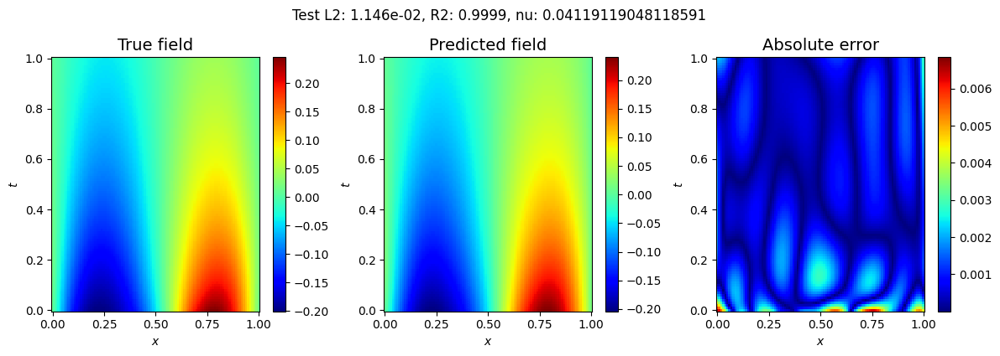

######################################################################################################################################################################################################################################
Mean MSE over test samples: 1.470e-06


In [17]:
"""# Test visualization"""

def loss_test_l2_error_one_sample(model_fn, params, data_output, u_sol_test, idx, return_data=False):

    t_test = jnp.linspace(0, 1, u_sol_test.shape[1])
    x_test = jnp.linspace(0, 1, u_sol_test.shape[2])

    xx_test, tt_test = jnp.meshgrid(x_test, t_test, indexing='ij')

    y = jnp.stack([tt_test.flatten(), xx_test.flatten()], axis=-1) #(100*100, 2)

    t = y[:,0]
    x = y[:,1]
    
    data_output_i = data_output[idx, :]
    data_output_i = data_output_i[jnp.newaxis,:]
    
    def ff_net(t_test, x_test):
        s_pred = apply_net(model_fn, params, data_output_i, t, x)
        return s_pred

    s_pred = ff_net(t, x)
    s_pred = s_pred.reshape(u_sol_test.shape[1], u_sol_test.shape[2])

    loss_test = mse(u_sol_test[idx, :, :], s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(l2_norm_error(u_sol_test[idx,:,:], s_pred))


    if return_data:
        return loss_test, l2_error, s_pred, u_sol_test[idx,:,:]
    else:
        return loss_test, l2_error

def visualize_show(model_fn, params, result_dir, epoch, data_output, u_sol_test, nu_test, idx, test=False):
    # Generate data, and obtain error
    loss_test, l2_error, s_pred, s_test = loss_test_l2_error_one_sample(model_fn, params, data_output, u_sol_test, idx, return_data=True)

    x = jnp.linspace(0, 1, s_pred.shape[1])
    t = jnp.linspace(0, 1, s_pred.shape[0])
    
    x_test, t_test = jnp.meshgrid(x, t, indexing='ij')


    # Calculate R² score
    r2_value = metrics.r2_score(s_test.flatten(), s_pred.flatten())
    r2_value = float('%.4f' % r2_value)

    # Plot
    fig = plt.figure(figsize=(12, 4))

    # Adjusting layout for more vertical space
    plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.7, wspace=0.4, hspace=0.1)

    # Plot Exact u over time using pcolor
    ax = fig.add_subplot(1, 3, 1)
    plt.pcolor(x_test, t_test, s_test.T, cmap='jet', shading='auto')
    plt.colorbar()
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$t$')
    ax.set_title('True field', fontsize=14)
    plt.tight_layout()

    # Plot Predicted u over time using pcolor
    ax = fig.add_subplot(1, 3, 2)
    plt.pcolor(x_test, t_test, s_pred.T, cmap='jet', shading='auto')
    plt.colorbar()
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$t$')
    ax.set_title('Predicted field', fontsize=14)
    plt.tight_layout()

    # Plot Absolute error using pcolor

    u_diff = s_test.T - s_pred.T

    ax = fig.add_subplot(1, 3, 3)
    plt.pcolor(x_test, t_test, jnp.abs(u_diff), cmap='jet', shading='auto')
    plt.colorbar()
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$t$')
    ax.set_title('Absolute error', fontsize=14)
    plt.tight_layout()


    if test:
        plt.suptitle(f'Test L2: {l2_error:.3e}, R2: {r2_value}, nu: {nu_test[idx]}', y=1.05)
    else:
        plt.suptitle(f'Train L2: {l2_error:.3e}, R2: {r2_value}', y=1.05)

    # Show or save the plot
    if save:
        plt.savefig(os.path.join(result_dir, f'Test_Sample_{idx+1}.pdf'))
    plt.show()
    plt.close()
    print(colored('#' * 230, 'green'))
    return r2_value  # Return R² score for each visualization

# Initialize an empty list to store MSE values
mse_values = []

# # Load the best model parameters
# best_params = load_model_params(result_dir, filename='model_params_best.pkl')
# print("Loaded best model parameters")


# Loop over every 20th index to visualize and calculate R²
for i in range(u_sol_test.shape[0]):
    if i % 10 == 0:
        idx = i
        print(f"Visualizing test sample at index {idx}")

        # Visualize and calculate R² score for every 20th index
        visualize_show(model_fn, params_loaded, result_dir, epochs, data_output, u_sol_test, nu_test, idx, True)

# Calculate loss and l2 error for test samples
loss_test, l2_error = loss_test_l2_error(model_fn, params_loaded, data_output, u_sol_test, return_data=False)

# Calculate and print the mean MSE over all test samples
# mean_mse = jnp.mean(jnp.array(mse_values))
print(f"Mean MSE over test samples: {loss_test:.3e}")

# Loss function

In [18]:
def s_x_net(model_fn, params, u_data, t, x):
    def f(t):
        u_sol = apply_net(model_fn, params, u_data, t, x)
        return u_sol
    _, s_x = jax.jvp(f, (t,), (jnp.ones_like(t),))
    
    return s_x

def loss_ics(model_fn, params, ics_batch, u_ic):
    inputs, sol_ic, nu_ic = ics_batch
    u_data, y = inputs
    
    t = y[1,:, 1] # pick any sample all are same
    x = y[1,:, 0]
    s_pred = apply_net(model_fn, params, u_data, t, x)

    u_ic = jnp.tile(u_ic[None, :], (s_pred.shape[0], 1))
    loss_ic = mse(u_ic, s_pred)
    
    return loss_ic

def loss_bcs(model_fn, params, bcs_batch):
    inputs, _, nu_bcs = bcs_batch
    u_data, y = inputs
    
    rand_num = random.randint(0, n_train)
    
    s_bc1_pred = apply_net(model_fn, params, u_data, y[rand_num,:, 1], y[rand_num,:, 0])
    s_bc2_pred = apply_net(model_fn, params, u_data, y[rand_num,:, 3], y[rand_num,:, 2])

    s_x_bc1_pred = s_x_net(model_fn, params, u_data, y[rand_num,:, 1], y[rand_num,:, 0])
    s_x_bc2_pred = s_x_net(model_fn, params, u_data, y[rand_num,:, 3], y[rand_num,:, 2])

    
    loss_s_bc = mse(s_bc1_pred, s_bc2_pred)
    loss_s_x_bc = mse(s_x_bc1_pred, s_x_bc2_pred)

    return loss_s_bc + loss_s_x_bc



def loss_res(model_fn_nu, model_fn, params_nu, params_loaded, res_batch):
    # Fetch data
    inputs, sol, nuu = res_batch
    u_data, y_res = inputs
    
    rand_num = random.randint(0, n_train)
    t = y_res[rand_num, :, 0]
    x = y_res[rand_num, :, 1]

    def f(t, x):
        return apply_net(model_fn, params_loaded, u_data, t, x)

    
    # Compute forward pass
    s = f(t, x)
    
    nu_pred = apply_net_nu(model_fn_nu, params_nu, u_data)
    
    # Compute first derivatives using jvp
    _, s_x = jax.jvp(lambda t: f(t, x), (t,), (jnp.ones_like(t),)) # changed f(t, x) to f(x, t)
    _, s_t = jax.jvp(lambda x: f(t, x), (x,), (jnp.ones_like(x),))


    _, s_xx = jax.jvp(lambda t: jax.jvp(lambda t: f(t, x), (t,), (jnp.ones_like(t),))[1], (t,), (jnp.ones_like(t),))
#     _, s_x = jax.jvp(lambda x: f(t, x), (x,), (jnp.ones_like(x),)) # changed f(t, x) to f(x, t)
#     _, s_t = jax.jvp(lambda t: f(t, x), (t,), (jnp.ones_like(t),))


#     _, s_xx = jax.jvp(lambda x: jax.jvp(lambda t: f(t, x), (x,), (jnp.ones_like(x),))[1], (x,), (jnp.ones_like(x),))


    nu_pred = nu_pred.reshape(-1,1)

    # Compute residual
    pred = s_t + s * s_x - nu_pred * s_xx

    # Compute loss
    loss = mse_single(pred)
    return loss

def loss_data(model_fn, params, data_batch):

    inputs, outputs, _ = data_batch
    u_data, y = inputs

    t = y[1, :, 0] # pick y for one sample (y is same for all samples)
    x = y[1, :, 1]

    s_pred = apply_net(model_fn, params, u_data, t, x)
    s_pred = s_pred.reshape(outputs.shape[0], outputs.shape[1], outputs.shape[2])

    loss = mse(outputs, s_pred)
    return loss

def loss_fn(model_fn_nu, model_fn, params, ics_batch, bcs_batch, res_batch, data_batch):
    params_loaded, params_nu = params
    loss_ics_i = loss_ics(model_fn, params_loaded, ics_batch, ic_and_nu_train[1, :-1])
    loss_bcs_i = loss_bcs(model_fn, params_loaded, bcs_batch)
    loss_res_i = loss_res(model_fn_nu, model_fn, params_nu, params_loaded, res_batch)
    loss_data_i = loss_data(model_fn, params_loaded, data_batch)
    
    loss_value =  loss_bcs_i + 1.0 * loss_ics_i + 50.0 * loss_res_i + 1*loss_data_i

    return loss_value

In [19]:
# loss_res(model_fn_nu, model_fn, params_nu, params_loaded, res_batch)

# Initialize model

In [20]:
# branch_nu_layers = [64, 64, 64]

In [21]:
"""# set the model"""

# Initialize model and params

branch_nu_layers = [branch_nu_layers] if isinstance(branch_nu_layers, int) else branch_nu_layers

# add output features to trunk and branch layers
branch_nu_layers = branch_nu_layers + [hidden_dim_nu]

# Convert list to tuples
branch_nu_layers = tuple(branch_nu_layers)

num_outputs = 1
model_nu = NuNet(branch_nu_layers, num_outputs)

params_nu = model_nu.init(key, jnp.ones(shape=(1, n_sensors * branch_input_features)))

# Print model from parameters
print('--- model_summary ---')
# count total params
total_params_nu = sum(x.size for x in jax.tree_util.tree_leaves(params_nu))
print(f'total params nu: {total_params_nu}')
print('--- model_summary ---')

# model function
model_fn_nu = jax.jit(model_nu.apply)


--- model_summary ---
total params nu: 27650
--- model_summary ---


# Test error function

In [22]:
"""# Test error function"""

def loss_test_l2_error_nu(model_fn_nu, params_nu, data_output, u_sol_test, nu_test, return_data=False):

    nu_pred = apply_net_nu(model_fn_nu, params_nu, u_sol_test)

    loss_test = mse(nu_test, nu_pred)

    def rel_abs_error(a, b):
        """Calculate realtive absolute error"""
        return jnp.abs(a - b)/a

    l2_error = jnp.mean(jax.vmap(rel_abs_error)(nu_test, nu_pred))

    if return_data:
        return loss_test, l2_error, nu_pred
    else:
        return loss_test, l2_error

# Define optimizer

In [23]:
"""# Define optimiser  of nu prediction"""

# Define optimizer with optax (ADAM)
# optimizer

lr_scheduler = optax.exponential_decay(lr, transition_steps, decay_rate)

# lr_scheduler = optax.constant_schedule(1e-3)

optimizer = optax.adam(learning_rate=lr_scheduler)

params = (params_loaded, params_nu) # include both parameters for training
opt_state = optimizer.init(params)

In [24]:
# Data
data_data = iter(data_dataset)
res_data = iter(res_dataset)
ics_data = iter(ics_dataset)
bcs_data = iter(bcs_dataset)


# create dir for saving results
result_dir = os.path.join(os.getcwd(), os.path.join(result_dir, f'{time.strftime("%Y%m%d-%H%M%S")}'))
log_file = os.path.join(result_dir, 'log.csv')
# Create directory
if not os.path.exists(result_dir):
    os.makedirs(result_dir)
if os.path.exists(os.path.join(result_dir, 'vis')):
    shutil.rmtree(os.path.join(result_dir, 'vis'))
if os.path.exists(log_file):
    os.remove(log_file)


with open(log_file, 'a') as f:
    f.write('epoch,loss,loss_ics_value,loss_bcs_value,loss_res_value,loss_data_value,rel_err_test,loss_test,runtime\n')

# save nu model

In [25]:
# Usage:
save = True
# Saving
if save:
    save_model_params(params, result_dir)

# training loop

In [26]:
"""# Training loop"""

# Iterations
epochs = epochs  # Assuming 'epochs' is defined elsewhere
log_iter = 1000
best_test_mse = float('inf')  # Initialize with infinity
# Save initial model at 0th iteration
save_model_params(params, result_dir, filename='model_params_0.pkl')
print("Saved initial model at iteration 0")
# Training loop
for it in range(epochs):
    if it == 1:
        # start timer and exclude first iteration (compile time)
        start = time.time()
    # Fetch data
    ics_batch = next(ics_data)
    bcs_batch = next(bcs_data)
    res_batch = next(res_data)
    data_batch = next(data_data)

    # Do Step

    loss, params, opt_state = step(optimizer, loss_fn, model_fn_nu, model_fn, opt_state,
                                   params, ics_batch, bcs_batch, res_batch, data_batch)
    if it % log_iter == 0:
        # Compute losses
        # def loss_res(model_fn_nu, model_fn, params_nu, params_loaded, res_batch):
        params_loaded, params_nu = params
        loss = loss_fn(model_fn_nu, model_fn, params, ics_batch, bcs_batch, res_batch, data_batch)
        loss_ics_value = loss_ics(model_fn, params_loaded, ics_batch, ic_and_nu_train[1, :-1])
        loss_bcs_value = loss_bcs(model_fn, params_loaded, bcs_batch)
        loss_res_value = loss_res(model_fn_nu, model_fn, params_nu, params_loaded, res_batch)
        loss_data_value = loss_data(model_fn, params_loaded, data_batch)
        
#         loss_test, rel_error = loss_test_l2_error_nu(model_fn_nu, params_nu, data_output, u_sol_test, nu_test, return_data=False)
        loss_test, rel_error = loss_test_l2_error(model_fn, params_loaded, data_output, u_sol_test, return_data=False)
        if loss_test < best_test_mse:
            best_test_mse = loss_test
            # Save the model as it's the best so far
            params = (params_loaded, params_nu) 
            save_model_params(params, result_dir, filename='model_params_best.pkl')
            print(f"New best model saved at iteration {it} with test MSE: {loss_test:.7f}")

        # get runtime
        if it == 0:
            runtime = 0
        else:
            runtime = time.time() - start

        # Print losses
        print(f"Iteration {it+1}/{epochs}")
        print(f"Trian_loss: {loss:.2e}, loss_ic: {loss_ics_value:.2e}, loss_bc: {loss_bcs_value:.2e}, "
              f"loss_res: {loss_res_value:.2e}, loss_data: {loss_data_value:.2e}, rel_err_test: {rel_error:.2e}, test_loss: {loss_test:.2e} , runtime: {runtime:06.2f}")
        
        # Save results
        with open(log_file, 'a') as f:
            f.write(f'{it+1}, {loss}, {loss_ics_value}, '
                    f'{loss_bcs_value}, {loss_res_value}, {loss_data_value}, {rel_error}, {loss_test}, {runtime}\n')

# Save results
runtime = time.time() - start
# Save initial model at 0th iteration
params = (params_loaded, params_nu) 
save_model_params(params, result_dir, filename='model_params_last.pkl')
print("Saved model at end of training")
with open(log_file, 'a') as f:
    f.write(f'{it + 1}, {loss}, {loss_ics_value}, '
            f'{loss_bcs_value}, {loss_res_value}, {loss_data_value}, {rel_error}, {loss_test}, {runtime}\n')

Saved initial model at iteration 0
New best model saved at iteration 0 with test MSE: 0.0258987
Iteration 1/80000
Trian_loss: 2.44e+00, loss_ic: 3.92e-02, loss_bc: 1.91e-01, loss_res: 4.36e-02, loss_data: 2.65e-02, rel_err_test: 1.29e+00, test_loss: 2.59e-02 , runtime: 000.00
New best model saved at iteration 1000 with test MSE: 0.0028458
Iteration 1001/80000
Trian_loss: 1.64e-02, loss_ic: 9.90e-03, loss_bc: 1.06e-03, loss_res: 5.11e-05, loss_data: 2.89e-03, rel_err_test: 5.21e-01, test_loss: 2.85e-03 , runtime: 008.61
New best model saved at iteration 2000 with test MSE: 0.0007654
Iteration 2001/80000
Trian_loss: 5.09e-03, loss_ic: 2.25e-03, loss_bc: 3.13e-04, loss_res: 3.55e-05, loss_data: 7.55e-04, rel_err_test: 2.58e-01, test_loss: 7.65e-04 , runtime: 017.23
New best model saved at iteration 3000 with test MSE: 0.0004238
Iteration 3001/80000
Trian_loss: 2.61e-03, loss_ic: 7.67e-04, loss_bc: 2.81e-04, loss_res: 2.33e-05, loss_data: 4.04e-04, rel_err_test: 1.96e-01, test_loss: 4.24e-

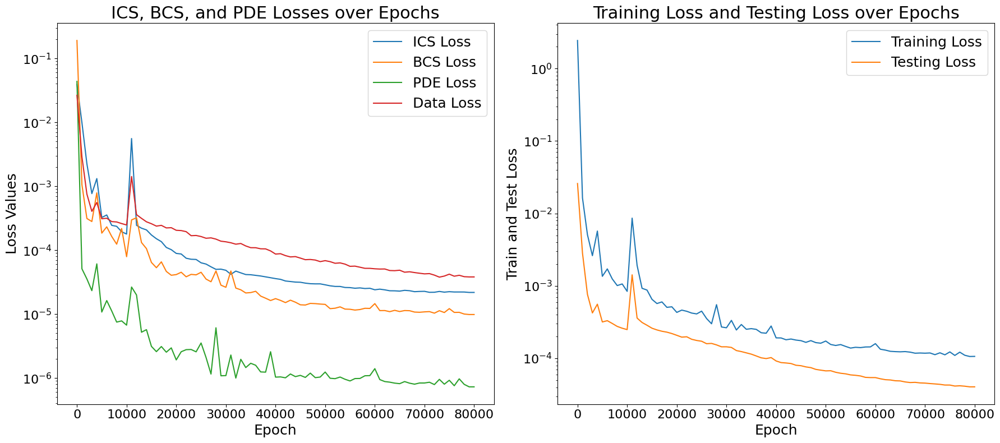

Plots saved to /kaggle/working/./20241026-235921/train_and_test_loss_plots.png


In [27]:
"""# Loss plots"""

# Set the result directory
# result_dir = "/kaggle/input/csv-log"

# Read the CSV file
csv_file = os.path.join(result_dir, "log.csv")  # Assuming the file is named "log.csv"
df = pd.read_csv(csv_file)

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), dpi=100)

# Set color palette
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Left plot: epoch vs loss_ics_value, loss_bcs_value, and loss_res_value
ax1.plot(df['epoch'], df['loss_ics_value'], label='ICS Loss', color=colors[0], linestyle='-')
ax1.plot(df['epoch'], df['loss_bcs_value'], label='BCS Loss', color=colors[1], linestyle='-')
ax1.plot(df['epoch'], df['loss_res_value'], label='PDE Loss', color=colors[2], linestyle='-')
ax1.plot(df['epoch'], df['loss_data_value'], label='Data Loss', color=colors[3], linestyle='-')
ax1.set_yscale("log")
ax1.set_xlabel('Epoch', fontsize=18)
ax1.set_ylabel('Loss Values', fontsize=18)
ax1.set_title('ICS, BCS, and PDE Losses over Epochs', fontsize=22)
ax1.legend(loc='best', fontsize=18)
ax1.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Right plot: epoch vs loss and l2err_val
ax2.plot(df['epoch'], df['loss'], label='Training Loss', color=colors[0], linestyle='-')
ax2.plot(df['epoch'], df['loss_test'], label='Testing Loss', color=colors[1], linestyle='-')
ax2.set_yscale("log")
ax2.set_xlabel('Epoch', fontsize=18)
ax2.set_ylabel('Train and Test Loss', fontsize=18)
ax2.set_title('Training Loss and Testing Loss over Epochs', fontsize=22)
ax2.legend(loc='best', fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=16)  # Set axis ticks font size

# Adjust layout and save the figure
plt.tight_layout()
output_file = os.path.join(result_dir, "train_and_test_loss_plots.png")
plt.savefig(output_file, dpi=100)
plt.show()
plt.close()

print(f"Plots saved to {output_file}")

Loaded best model parameters
Visualizing test sample at index 0


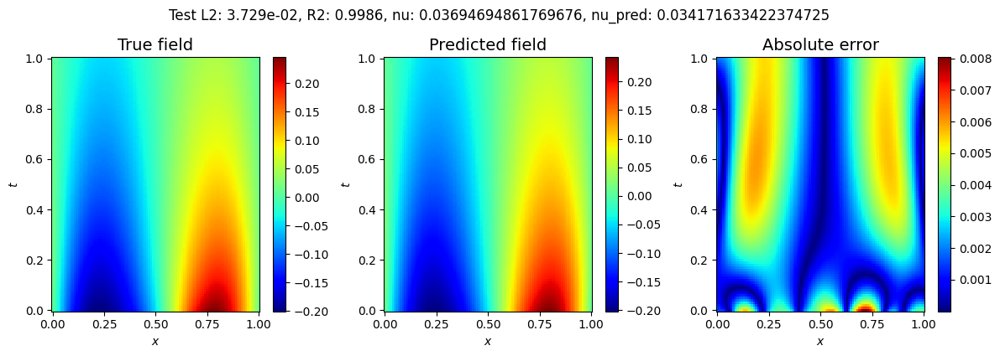

######################################################################################################################################################################################################################################
Visualizing test sample at index 10


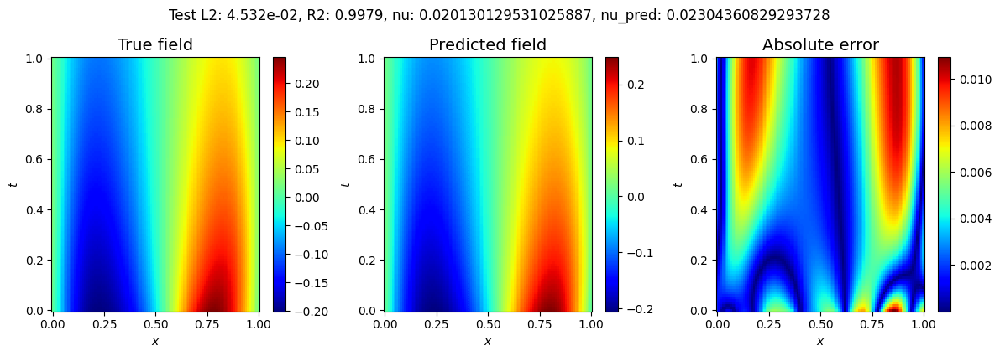

######################################################################################################################################################################################################################################
Visualizing test sample at index 20


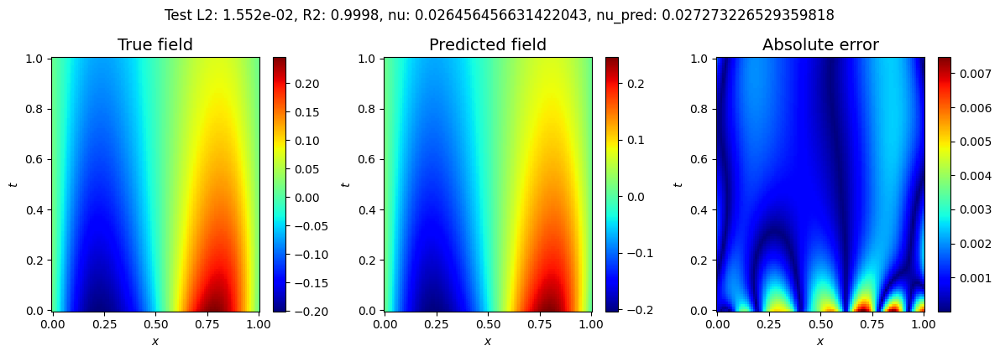

######################################################################################################################################################################################################################################
Visualizing test sample at index 30


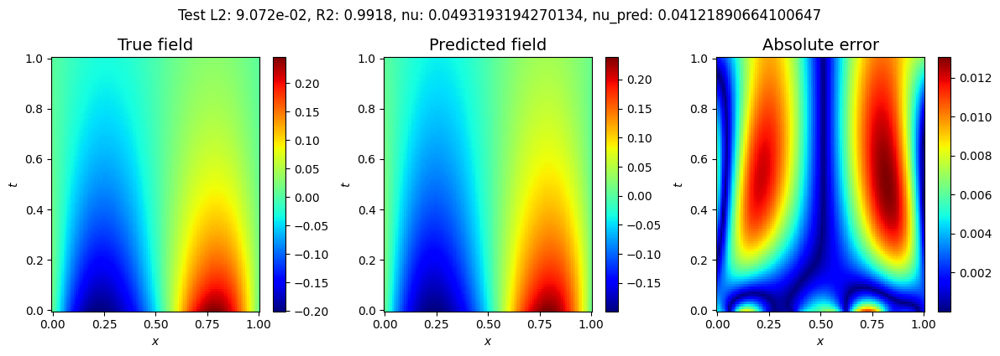

######################################################################################################################################################################################################################################
Visualizing test sample at index 40


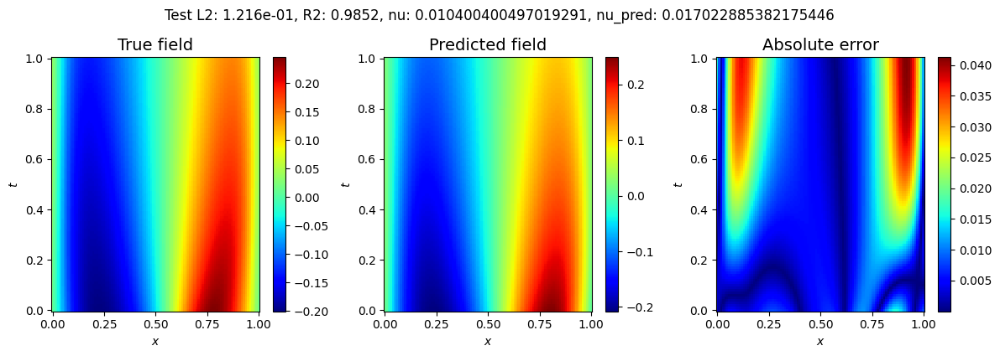

######################################################################################################################################################################################################################################
Visualizing test sample at index 50


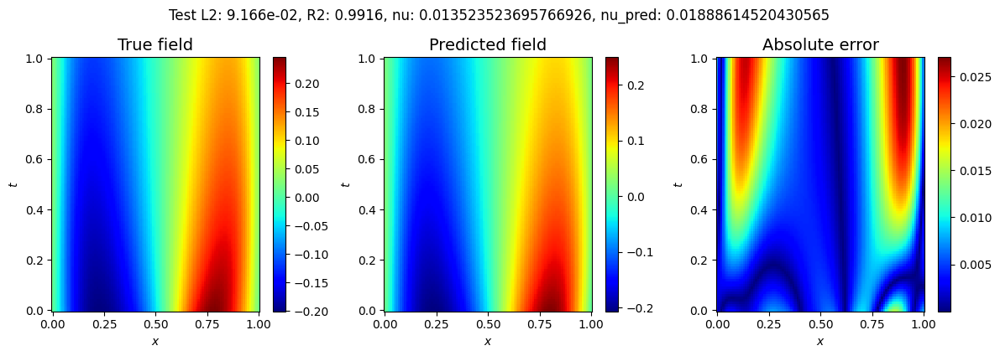

######################################################################################################################################################################################################################################
Visualizing test sample at index 60


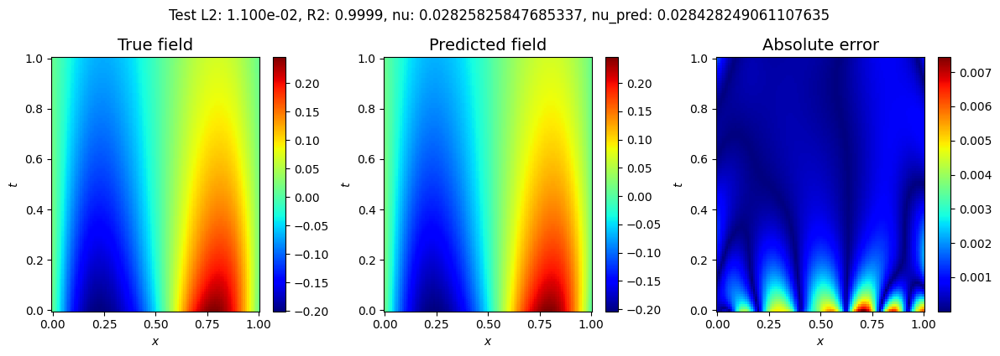

######################################################################################################################################################################################################################################
Visualizing test sample at index 70


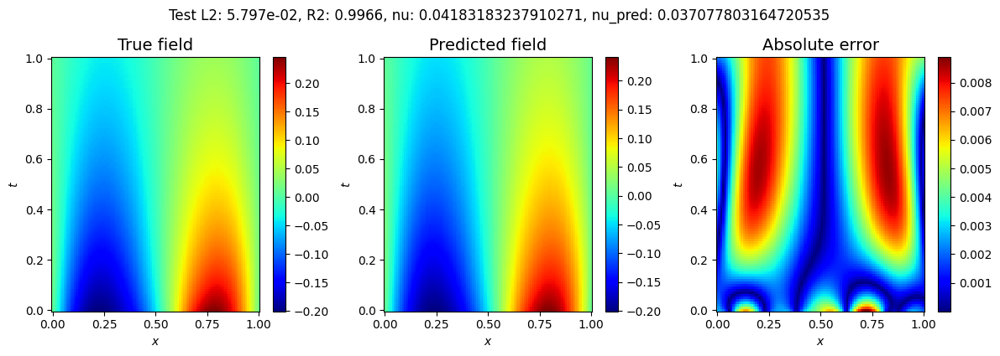

######################################################################################################################################################################################################################################
Visualizing test sample at index 80


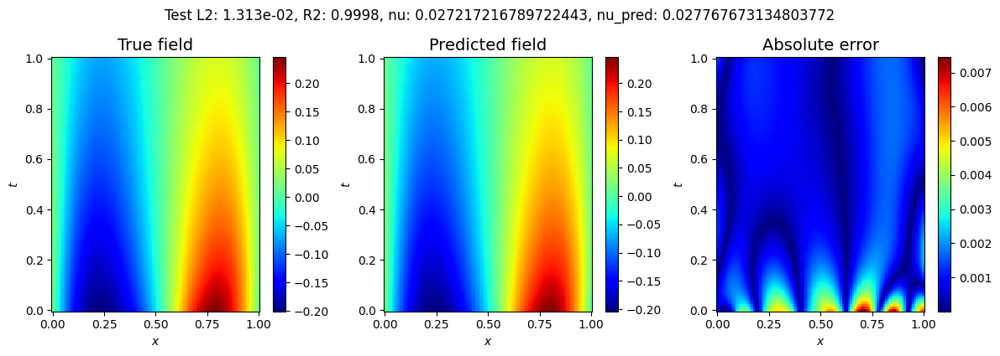

######################################################################################################################################################################################################################################
Visualizing test sample at index 90


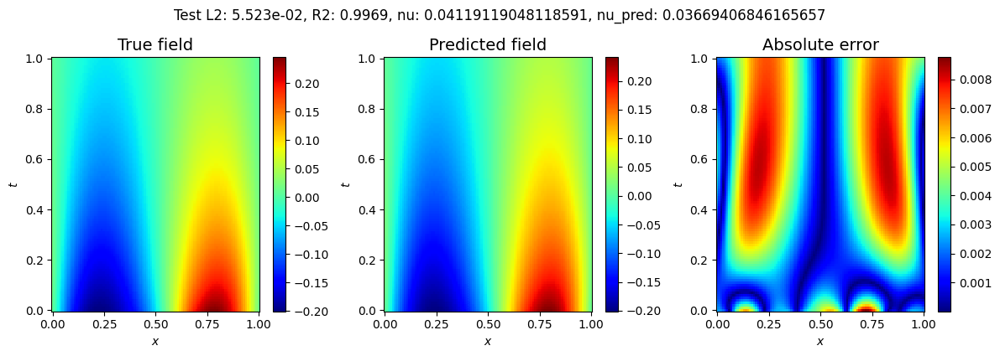

######################################################################################################################################################################################################################################
Mean MSE over test samples: 4.049e-05


In [28]:
"""# Test visualization"""

def loss_test_l2_error_one_sample(model_fn, params_loaded, data_output, u_sol_test, idx, return_data=False):
    
    t_test = jnp.linspace(0, 1, u_sol_test.shape[1])
    x_test = jnp.linspace(0, 1, u_sol_test.shape[2])

    xx_test, tt_test = jnp.meshgrid(x_test, t_test, indexing='ij')

    y = jnp.stack([tt_test.flatten(), xx_test.flatten()], axis=-1) #(100*100, 2)

    t = y[:,0]
    x = y[:,1]

    data_output_i = data_output[idx, :]
    data_output_i = data_output_i[jnp.newaxis,:]
    
    def ff_net(t, x):
        s_pred = apply_net(model_fn, params_loaded, data_output_i, t, x)
        return s_pred

    s_pred = ff_net(t, x)

    s_pred = s_pred.reshape(u_sol_test.shape[1], u_sol_test.shape[2])

    loss_test = mse(u_sol_test[idx, :, :], s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(l2_norm_error(u_sol_test[idx,:,:], s_pred))


    if return_data:
        return loss_test, l2_error, s_pred, u_sol_test[idx,:,:]
    else:
        return loss_test, l2_error

def visualize_show(model_fn_nu, model_fn, params, result_dir, epoch, data_output, u_sol_test, nu_test, idx, test=False):

    params_loaded, params_nu = params
    loss_test, l2_error, s_pred, s_test = loss_test_l2_error_one_sample(model_fn, params_loaded, data_output, u_sol_test, idx, return_data=True)
    
    nu_pred = apply_net_nu(model_fn_nu, params_nu, data_output)
    # Modify x and t to match the shapes of u and s_pred
    x = jnp.linspace(0, 1, s_pred.shape[1])
    t = jnp.linspace(0, 1, s_pred.shape[0])
    
    x_test, t_test = jnp.meshgrid(x, t, indexing='ij')


    # Calculate R² score
    r2_value = metrics.r2_score(s_test.flatten(), s_pred.flatten())
    r2_value = float('%.4f' % r2_value)

    # Plot
    fig = plt.figure(figsize=(12, 4))

    # Adjusting layout for more vertical space
    plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.7, wspace=0.4, hspace=0.1)


#     print(output_data[idx,:,:].shape)
    # Plot Exact u over time using pcolor
    ax = fig.add_subplot(1, 3, 1)
    plt.pcolor(x_test, t_test, s_test.T, cmap='jet', shading='auto')
    plt.colorbar()
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$t$')
    ax.set_title('True field', fontsize=14)
    plt.tight_layout()


    # Plot Predicted u over time using pcolor
    ax = fig.add_subplot(1, 3, 2)
    plt.pcolor(x_test, t_test, s_pred.T, cmap='jet', shading='auto')
    plt.colorbar()
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$t$')
    ax.set_title('Predicted field', fontsize=14)
    plt.tight_layout()

    # Plot Absolute error using pcolor

    u_diff = s_test.T - s_pred.T

    ax = fig.add_subplot(1, 3, 3)
    plt.pcolor(x_test, t_test, jnp.abs(u_diff), cmap='jet', shading='auto')
    plt.colorbar()
    ax.set_xlabel(r'$x$')
    ax.set_ylabel(r'$t$')
    ax.set_title('Absolute error', fontsize=14)
    plt.tight_layout()


    if test:
        plt.suptitle(f'Test L2: {l2_error:.3e}, R2: {r2_value}, nu: {nu_test[idx]}, nu_pred: {nu_pred[idx]}', y=1.05)
    else:
        plt.suptitle(f'Train L2: {l2_error:.3e}, R2: {r2_value}', y=1.05)

    # Show or save the plot
    if save:
        plt.savefig(os.path.join(result_dir, f'Test_Sample_{idx+1}.pdf'))
    plt.show()
    plt.close()
    print(colored('#' * 230, 'green'))
    return r2_value  # Return R² score for each visualization

# Initialize an empty list to store MSE values
mse_values = []

# Load the best model parameters
filename='model_params_best.pkl'
# filename='model_params.pkl'


load_path = os.path.join(result_dir, filename)
with open(load_path, 'rb') as f:
    best_params = pickle.load(f)
        
# best_params = load_model_params(result_dir, filename='model_params_best.pkl')
print("Loaded best model parameters")


# Loop over every 20th index to visualize and calculate R²
for i in range(u_sol_test.shape[0]):
    if i % 10 == 0:
        idx = i
        print(f"Visualizing test sample at index {idx}")

        # Visualize and calculate R² score for every 20th index
        visualize_show(model_fn_nu, model_fn, best_params, result_dir, epochs, data_output, u_sol_test, nu_test, idx, True)

params_loaded, params_nu = best_params
# Calculate loss and l2 error for test samples
loss_test, l2_error = loss_test_l2_error(model_fn, params_loaded, data_output, u_sol_test, return_data=False)

# Calculate and print the mean MSE over all test samples
# mean_mse = jnp.mean(jnp.array(mse_values))
print(f"Mean MSE over test samples: {loss_test:.3e}")

Loaded best model parameters
Visualizing test sample at index 0


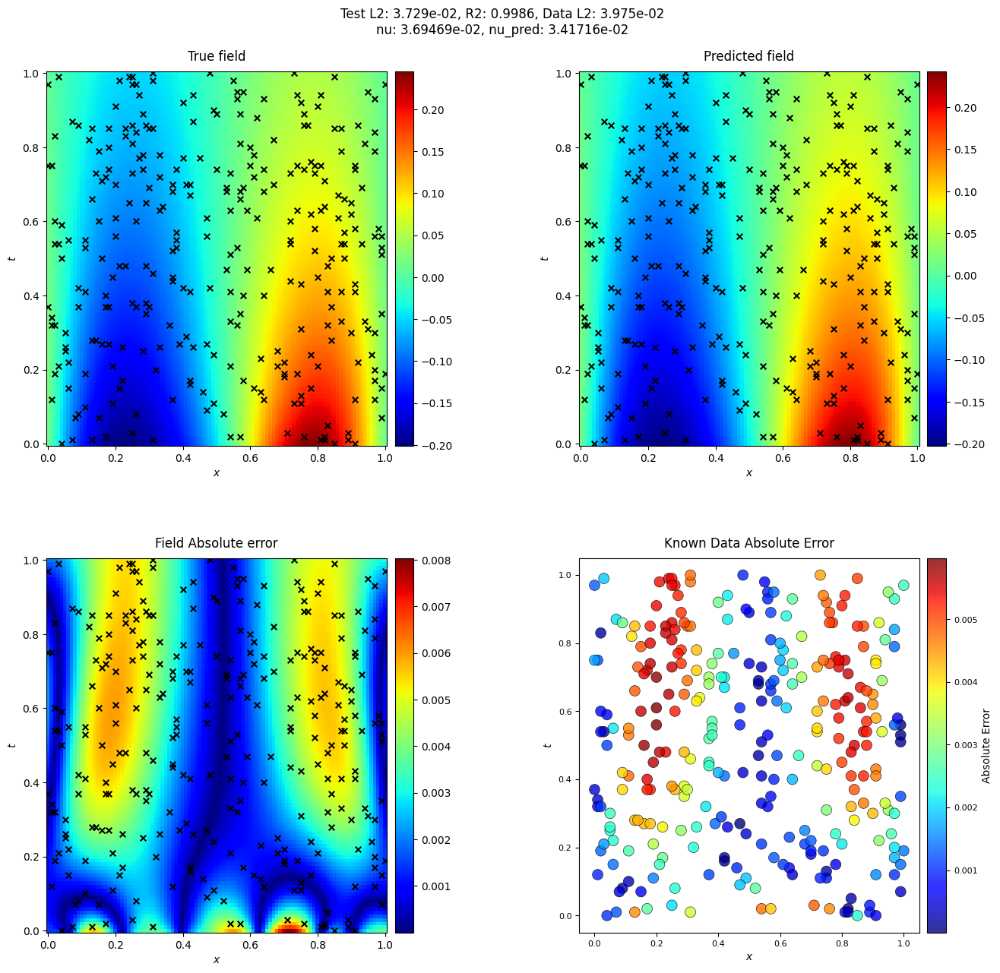

######################################################################################################################################################################################################################################
Visualizing test sample at index 10


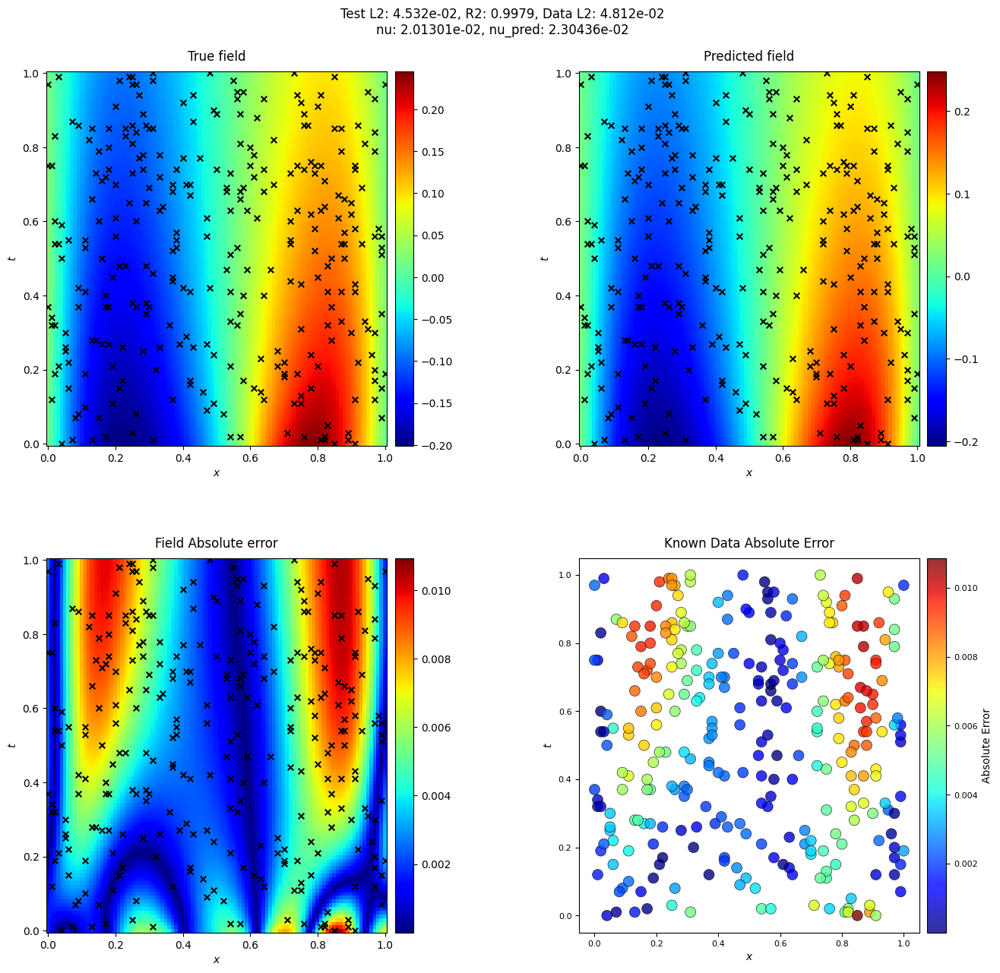

######################################################################################################################################################################################################################################
Visualizing test sample at index 20


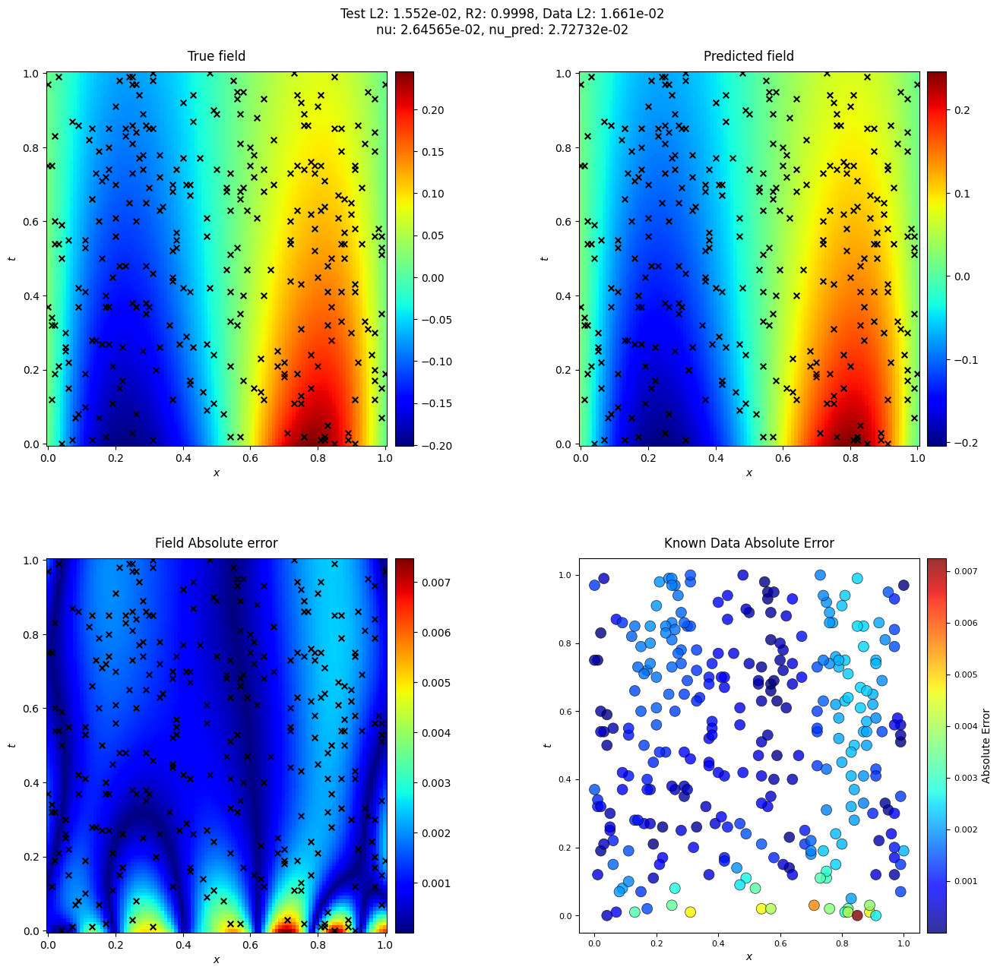

######################################################################################################################################################################################################################################
Visualizing test sample at index 30


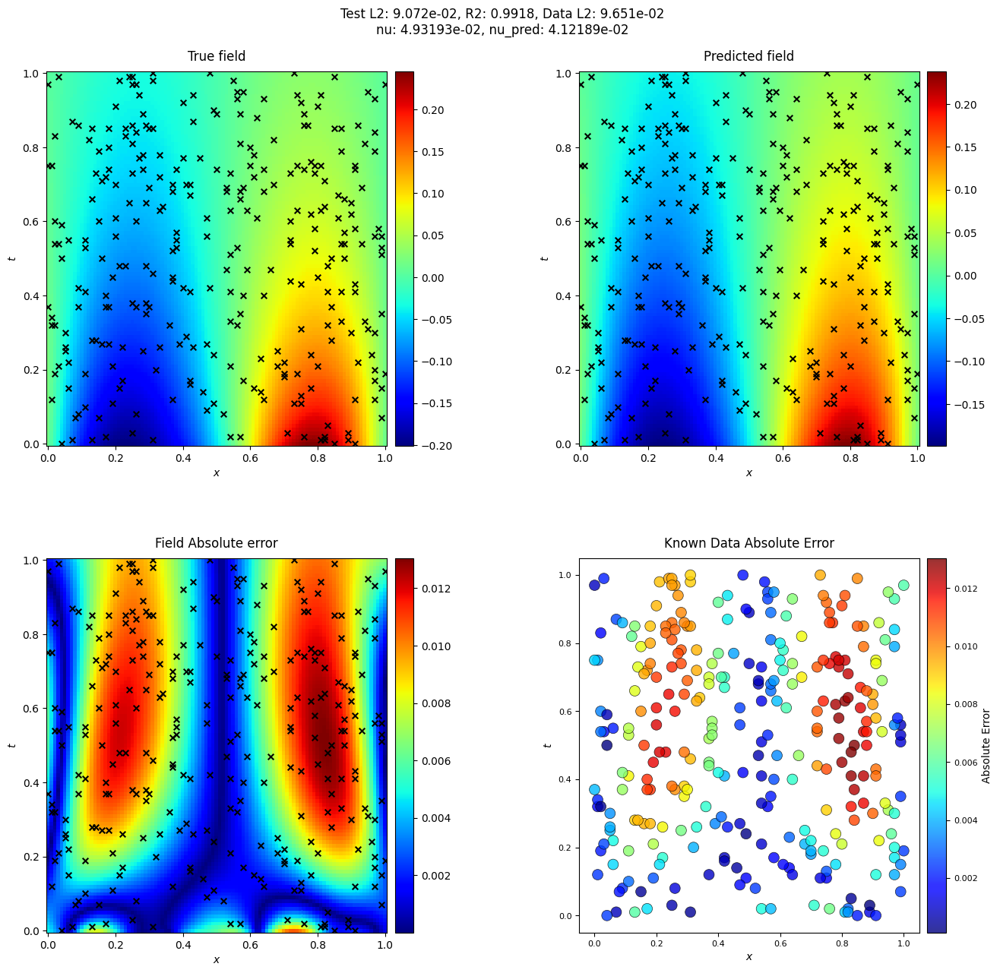

######################################################################################################################################################################################################################################
Visualizing test sample at index 40


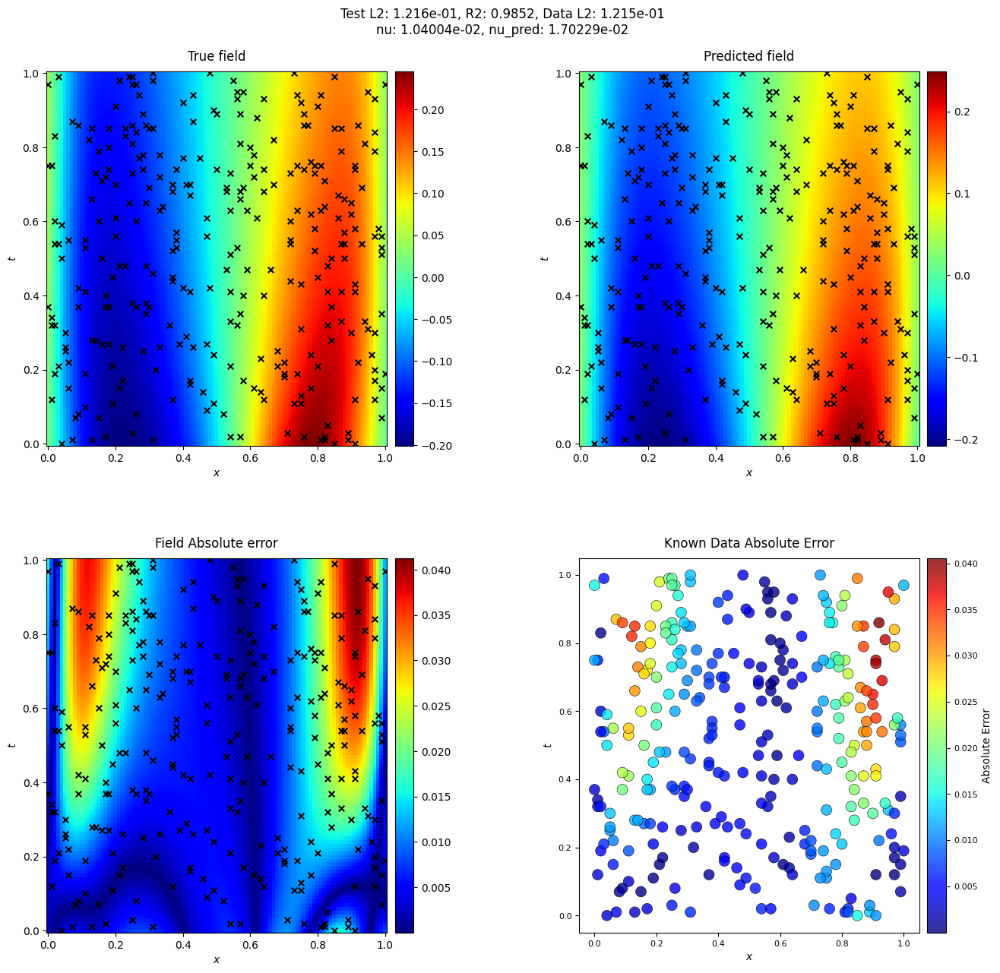

######################################################################################################################################################################################################################################
Visualizing test sample at index 50


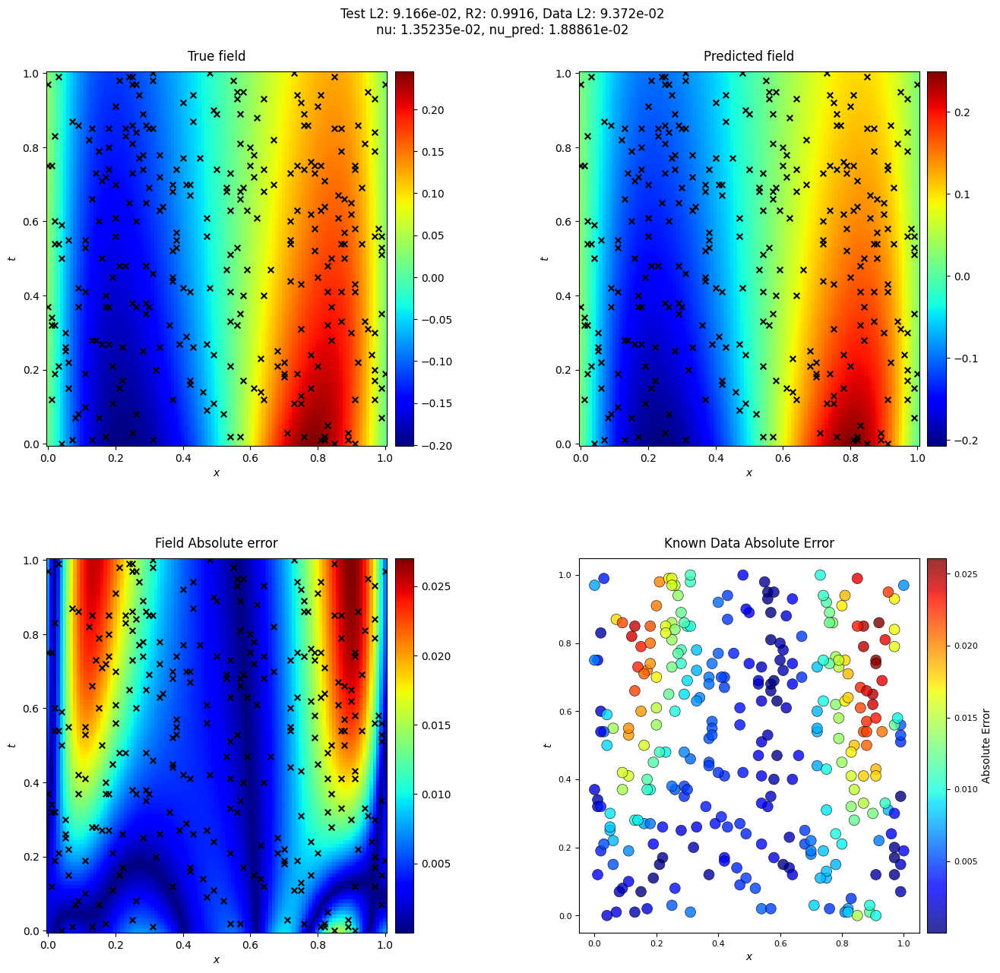

######################################################################################################################################################################################################################################
Visualizing test sample at index 60


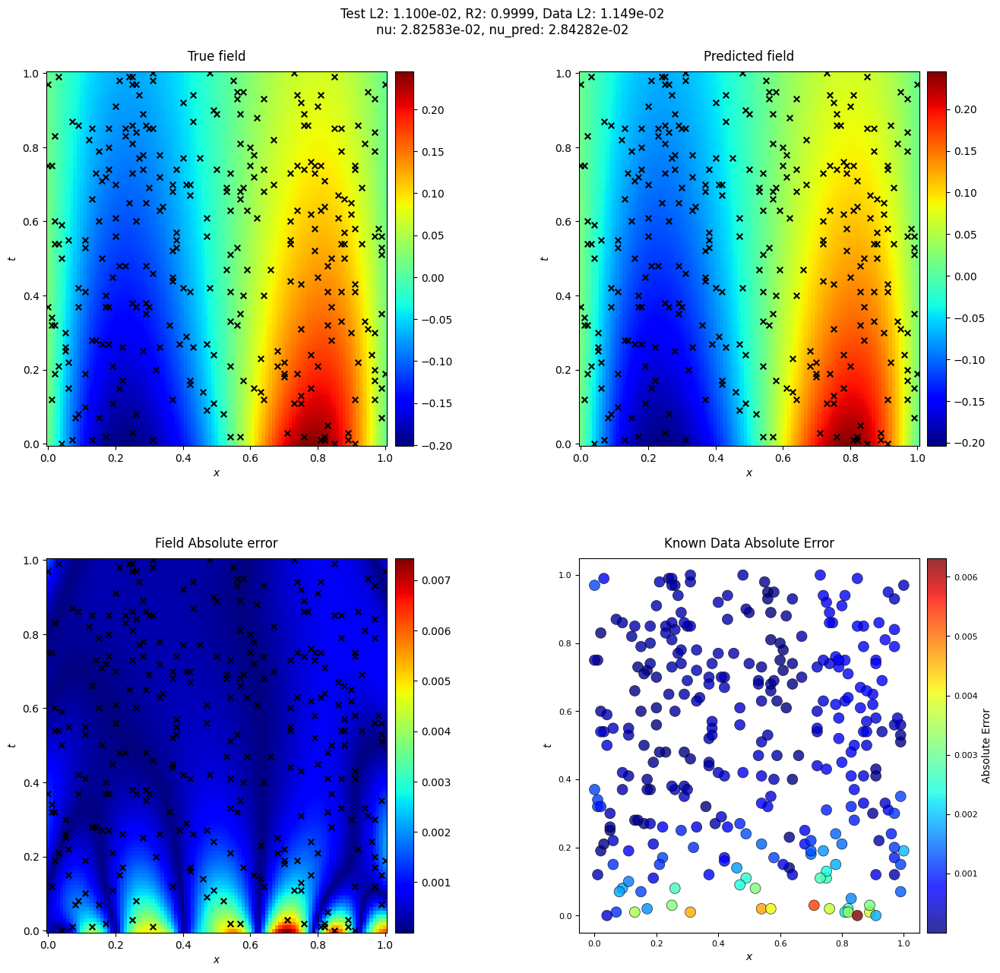

######################################################################################################################################################################################################################################
Visualizing test sample at index 70


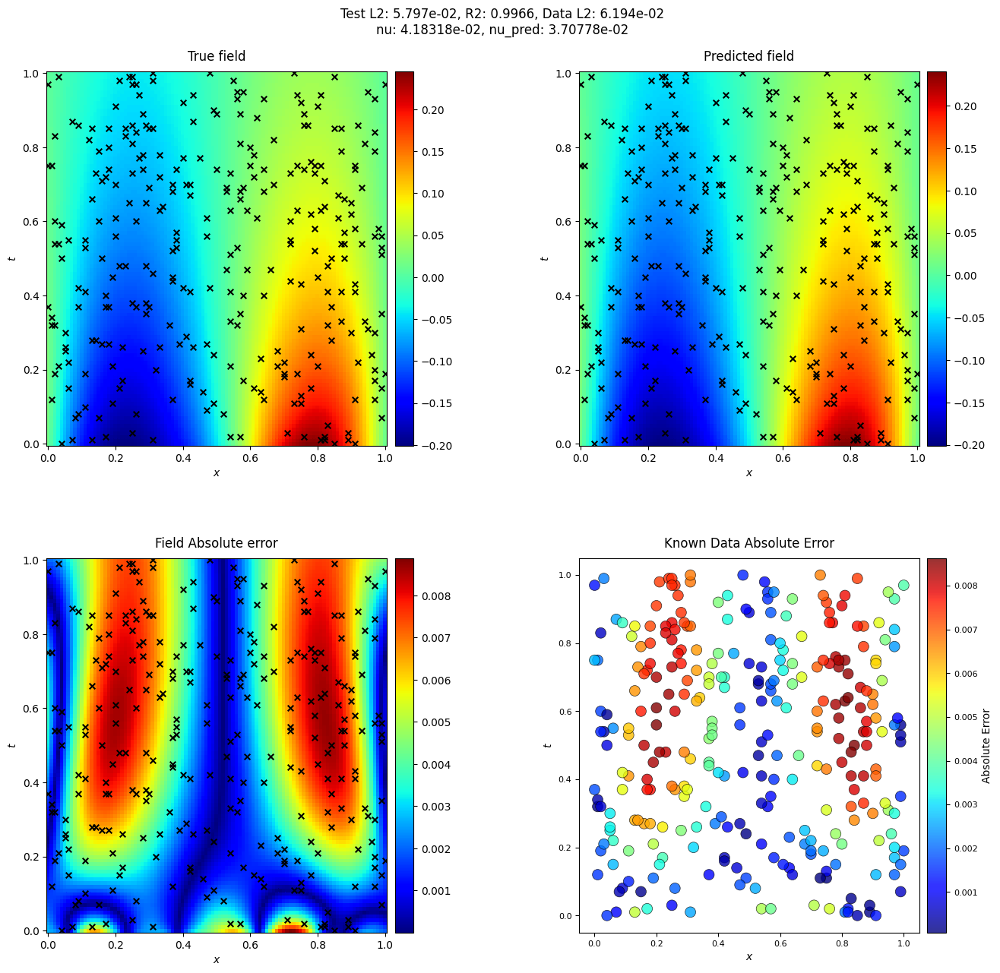

######################################################################################################################################################################################################################################
Visualizing test sample at index 80


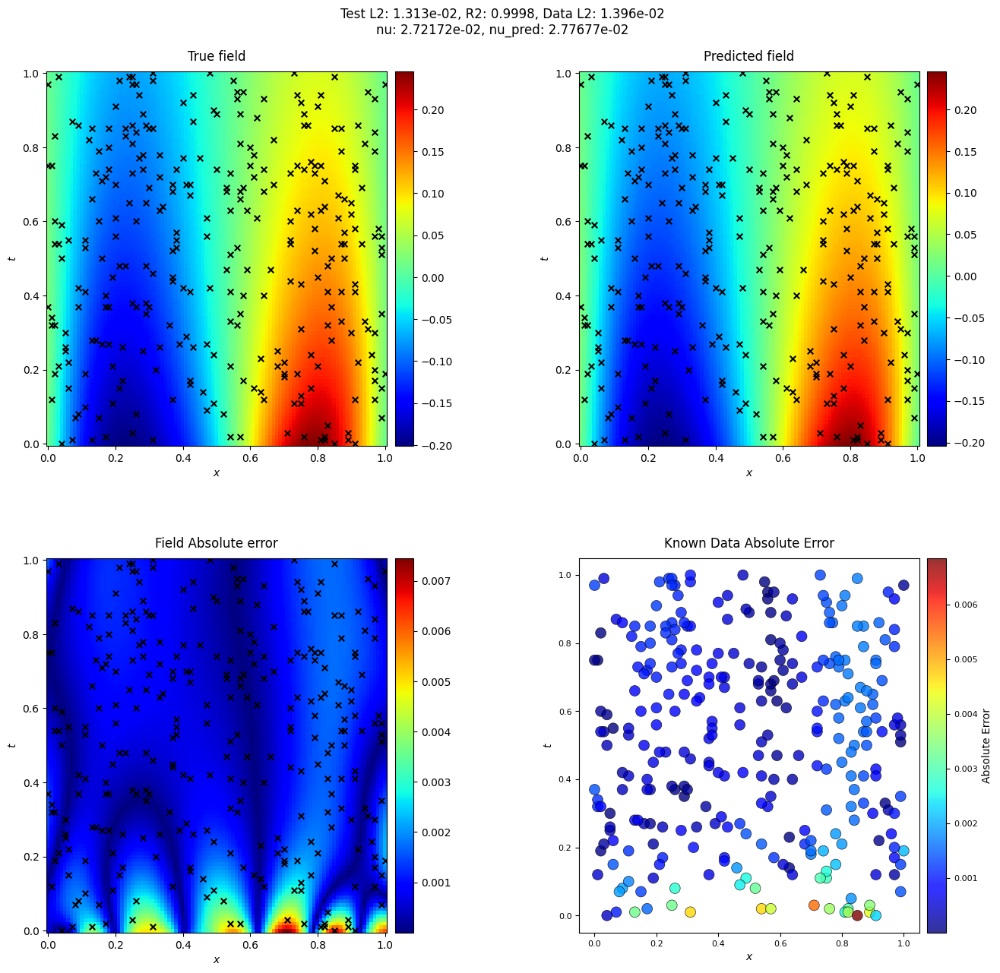

######################################################################################################################################################################################################################################
Visualizing test sample at index 90


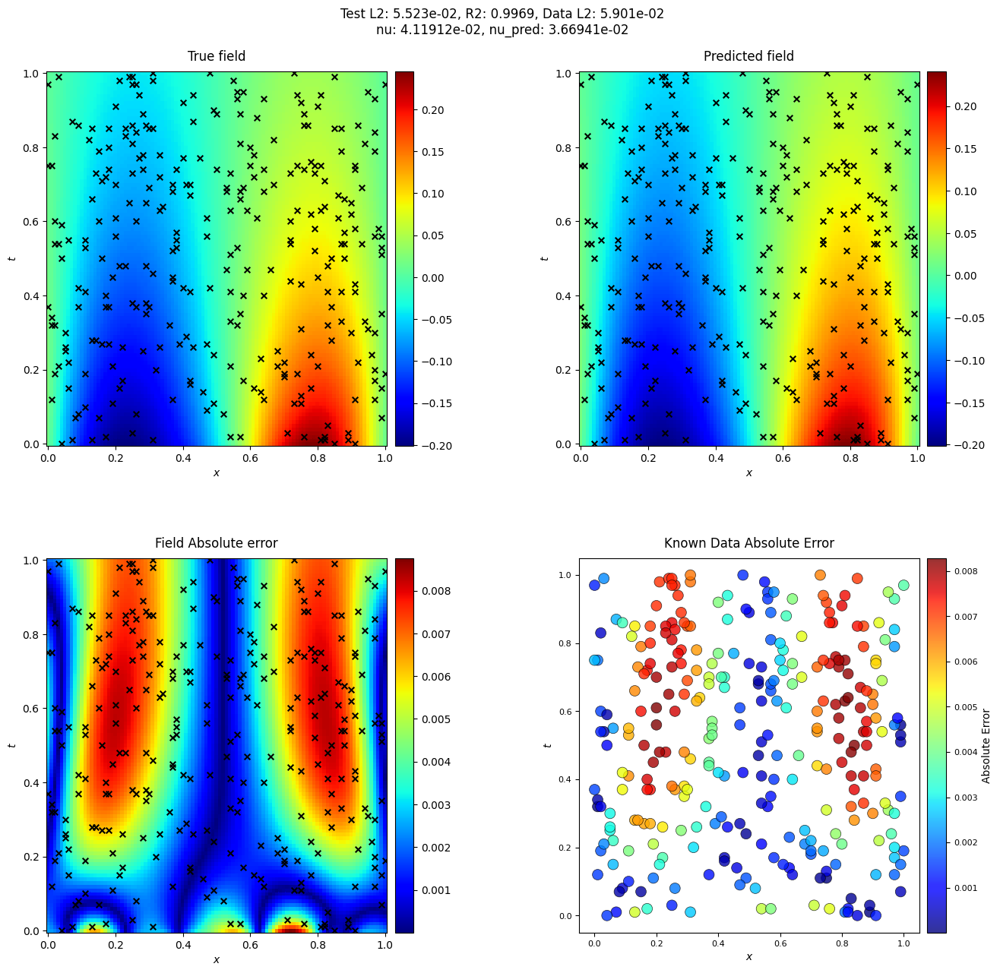

######################################################################################################################################################################################################################################
Mean MSE over test samples: 4.049e-05


In [50]:
"""# Test visualization"""

def loss_test_l2_error_one_sample(model_fn, params_loaded, data_output, u_sol_test, idx, location_test, return_data=False):
    
    t_test = jnp.linspace(0, 1, u_sol_test.shape[1])
    x_test = jnp.linspace(0, 1, u_sol_test.shape[2])

    xx_test, tt_test = jnp.meshgrid(x_test, t_test, indexing='ij')

    y = jnp.stack([tt_test.flatten(), xx_test.flatten()], axis=-1) #(100*100, 2)

    t = y[:,0]
    x = y[:,1]

    data_output_i = data_output[idx, :]
    data_output_i = data_output_i[jnp.newaxis,:]
    
    def ff_net(t, x):
        s_pred = apply_net(model_fn, params_loaded, data_output_i, t, x)
        return s_pred

    s_pred = ff_net(t, x)

    s_pred = s_pred.reshape(u_sol_test.shape[1], u_sol_test.shape[2])

    loss_test = mse(u_sol_test[idx, :, :], s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(l2_norm_error(u_sol_test[idx,:,:], s_pred))

    # at known data (loactions)
    seed = 0
    key = jax.random.PRNGKey(seed)
    samples, ntt, nxx = u_sol_test.shape
    flattened_data = u_sol_test.reshape(samples, ntt * nxx)
    random_indices = jax.random.choice(key, ntt * nxx, shape=(300,), replace=False)
    t_indices = random_indices // ntt
    x_indices = random_indices % nxx
    
    s_pred_known_loc = s_pred[t_indices, x_indices]
    l2_error_data = jnp.mean(l2_norm_error(data_output[idx, :], s_pred_known_loc))
    
    if return_data:
        return loss_test, l2_error, s_pred, u_sol_test[idx,:,:], l2_error_data, s_pred_known_loc, data_output[idx, :]
    else:
        return loss_test, l2_error



def visualize_show(model_fn_nu, model_fn, params, result_dir, epoch, data_output, u_sol_test, nu_test, idx, location_test, test=False, save=False):
    params_loaded, params_nu = params
    loss_test, l2_error, s_pred, s_test, l2_error_data, s_pred_known_loc, s_known_data = loss_test_l2_error_one_sample(model_fn, params_loaded, data_output, u_sol_test, idx, location_test, return_data=True)
    
    nu_pred = apply_net_nu(model_fn_nu, params_nu, data_output)
    
    # Modify x and t to match the shapes of u and s_pred
    x = jnp.linspace(0, 1, s_pred.shape[1])
    t = jnp.linspace(0, 1, s_pred.shape[0])
    
    x_test, t_test = jnp.meshgrid(x, t, indexing='ij')

    # Calculate R² score
    r2_value = metrics.r2_score(s_test.flatten(), s_pred.flatten())
    r2_value = float('%.4f' % r2_value)

    # Create figure with 2x2 subplot layout
    fig = plt.figure(figsize=(16, 14))  # Increased height
    
    # Add the main title at the top with extra padding
    if test:
        title_text = f'Test L2: {l2_error:.3e}, R2: {r2_value}, Data L2: {l2_error_data:.3e}\nnu: {nu_test[idx]:.5e}, nu_pred: {nu_pred[idx]:.5e}'
    else:
        title_text = f'Train L2: {l2_error:.3e}, R2: {r2_value}'
    
    fig.suptitle(title_text, y=0.98, fontsize=12)
    
    # Create gridspec for better control over spacing
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1])
    gs.update(wspace=0.3, hspace=0.3)  # Increased spacing between plots

    # Plot 1: True field
    ax1 = plt.subplot(gs[0, 0])
    pcm1 = plt.pcolor(x_test, t_test, s_test.T, cmap='jet', shading='auto')
    cb1 = plt.colorbar(pcm1, ax=ax1, pad=0.02)
    plt.scatter(location_test[:,1], location_test[:,0], marker='x', s=30, color='black')
    ax1.set_xlabel(r'$x$')
    ax1.set_ylabel(r'$t$')
    ax1.set_title('True field', fontsize=12, pad=10)

    # Plot 2: Predicted field
    ax2 = plt.subplot(gs[0, 1])
    pcm2 = plt.pcolor(x_test, t_test, s_pred.T, cmap='jet', shading='auto')
    cb2 = plt.colorbar(pcm2, ax=ax2, pad=0.02)
    plt.scatter(location_test[:,1], location_test[:,0], marker='x', s=30, color='black')
    ax2.set_xlabel(r'$x$')
    ax2.set_ylabel(r'$t$')
    ax2.set_title('Predicted field', fontsize=12, pad=10)

    # Plot 3: Field Absolute error
    ax3 = plt.subplot(gs[1, 0])
    u_diff = s_test.T - s_pred.T
    pcm3 = plt.pcolor(x_test, t_test, jnp.abs(u_diff), cmap='jet', shading='auto')
    cb3 = plt.colorbar(pcm3, ax=ax3, pad=0.02)
    plt.scatter(location_test[:,1], location_test[:,0], marker='x', s=30, color='black')
    ax3.set_xlabel(r'$x$')
    ax3.set_ylabel(r'$t$')
    ax3.set_title('Field Absolute error', fontsize=12, pad=10)

    # Plot 4: Known data absolute error
    ax4 = plt.subplot(gs[1, 1])
    data_errors = jnp.abs(s_known_data - s_pred_known_loc)

    # Create scatter plot of the errors
    scatter = ax4.scatter(
        location_test[:, 1], location_test[:, 0], 
        c=data_errors, cmap='jet', 
        s=100, alpha=0.8, edgecolor='k', linewidth=0.5
    )

    # Add colorbar with label
    cb4 = plt.colorbar(scatter, ax=ax4, pad=0.02)
    cb4.set_label('Absolute Error', fontsize=10)
    cb4.ax.tick_params(labelsize=8)
    ax4.set_xlabel(r'$x$', fontsize=10)
    ax4.set_ylabel(r'$t$', fontsize=10)
    ax4.set_title('Known Data Absolute Error', fontsize=12, pad=10)
    ax4.tick_params(axis='both', which='major', labelsize=8)


    # Adjust layout to prevent overlapping
    plt.subplots_adjust(top=0.92)  # Make room for suptitle
    
    # Save if requested
    if save:
        plt.savefig(os.path.join(result_dir, f'Test_Sample_{idx+1}.pdf'), 
                   bbox_inches='tight', dpi=300)
    
    plt.show()
    plt.close()
    print(colored('#' * 230, 'green'))
    
    return r2_value

# Initialize an empty list to store MSE values
mse_values = []

# Load the best model parameters
filename='model_params_best.pkl'
# filename='model_params.pkl'


load_path = os.path.join(result_dir, filename)
with open(load_path, 'rb') as f:
    best_params = pickle.load(f)
        
# best_params = load_model_params(result_dir, filename='model_params_best.pkl')
print("Loaded best model parameters")


# Loop over every 20th index to visualize and calculate R²
for i in range(u_sol_test.shape[0]):
    if i % 10 == 0:
        idx = i
        print(f"Visualizing test sample at index {idx}")

        # Visualize and calculate R² score for every 20th index
        visualize_show(model_fn_nu, model_fn, best_params, result_dir, epochs, data_output, u_sol_test, nu_test, idx, location_test, True)

params_loaded, params_nu = best_params
# Calculate loss and l2 error for test samples
loss_test, l2_error = loss_test_l2_error(model_fn, params_loaded, data_output, u_sol_test, return_data=False)

# Calculate and print the mean MSE over all test samples
# mean_mse = jnp.mean(jnp.array(mse_values))
print(f"Mean MSE over test samples: {loss_test:.3e}")

# CHECKING FOR FEW TRAINING SETS

In [53]:
data_output_train, location_train, y_train_trail = extract_points(u_sol_train, p_data_train)

Loaded best model parameters
Visualizing test sample at index 0


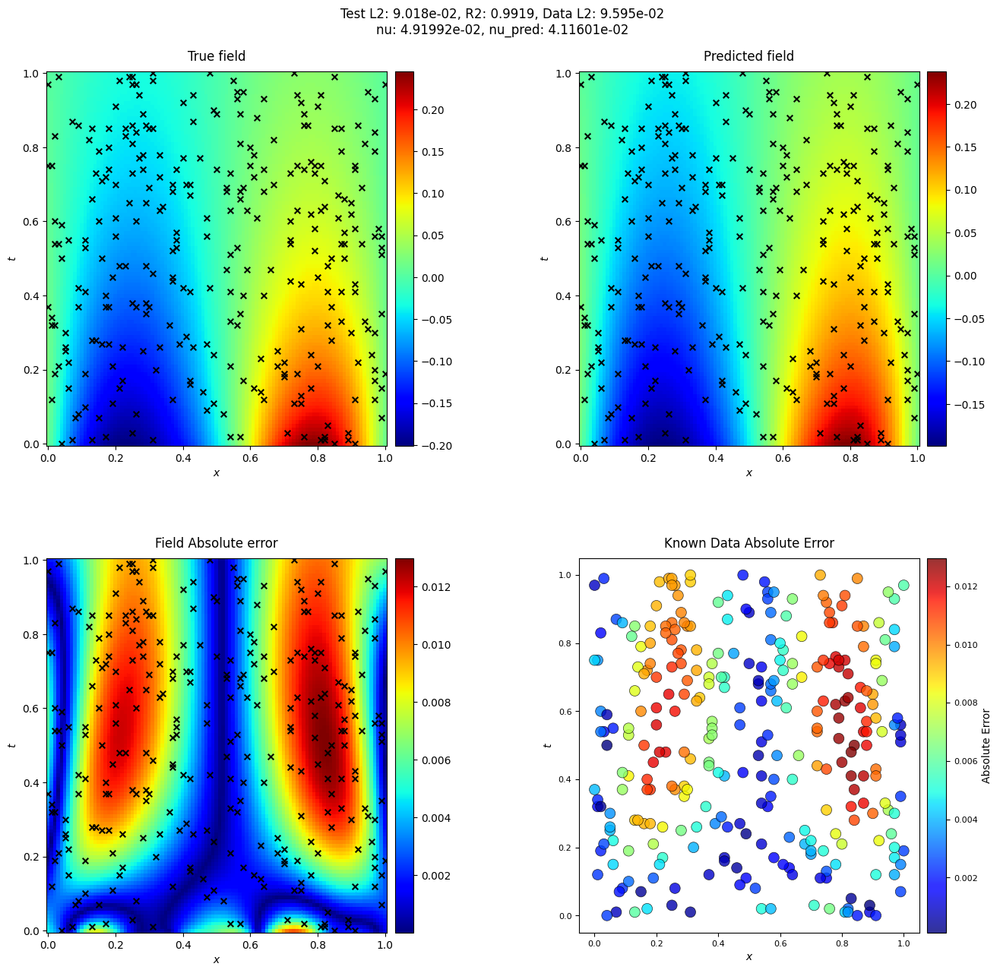

######################################################################################################################################################################################################################################
Visualizing test sample at index 10


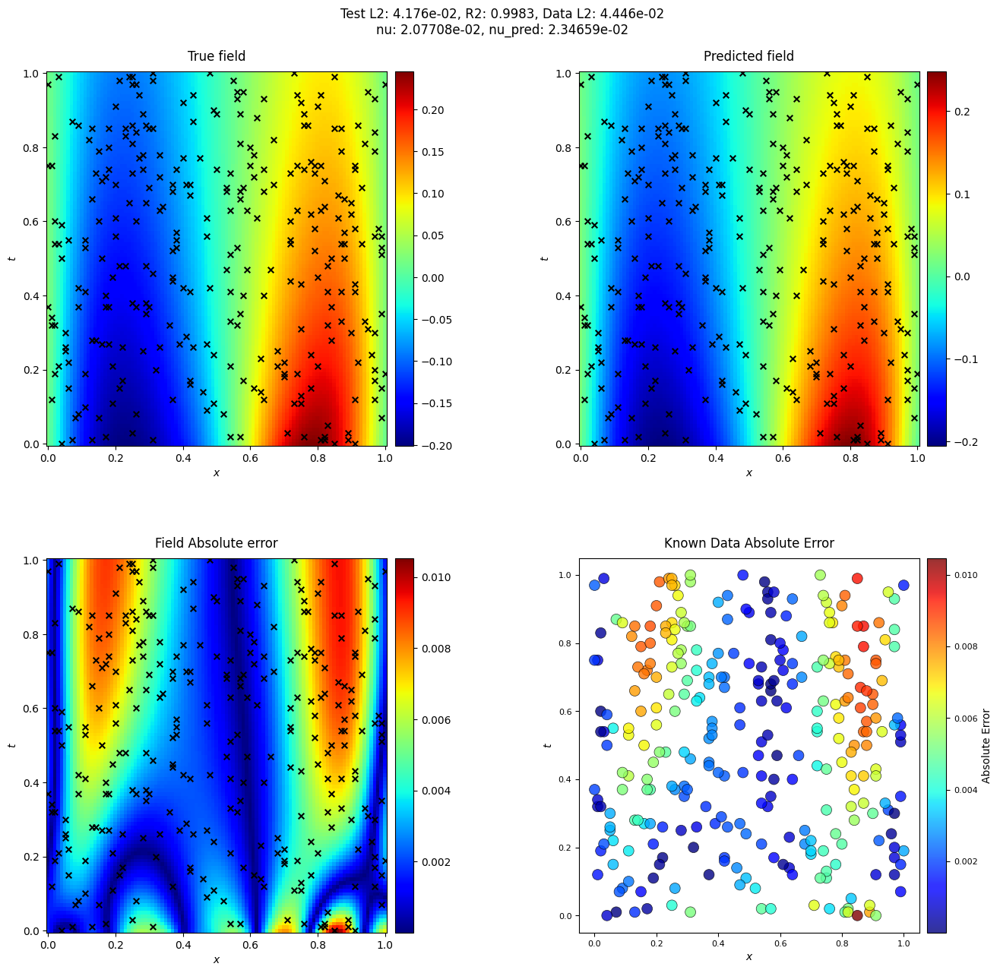

######################################################################################################################################################################################################################################
Visualizing test sample at index 20


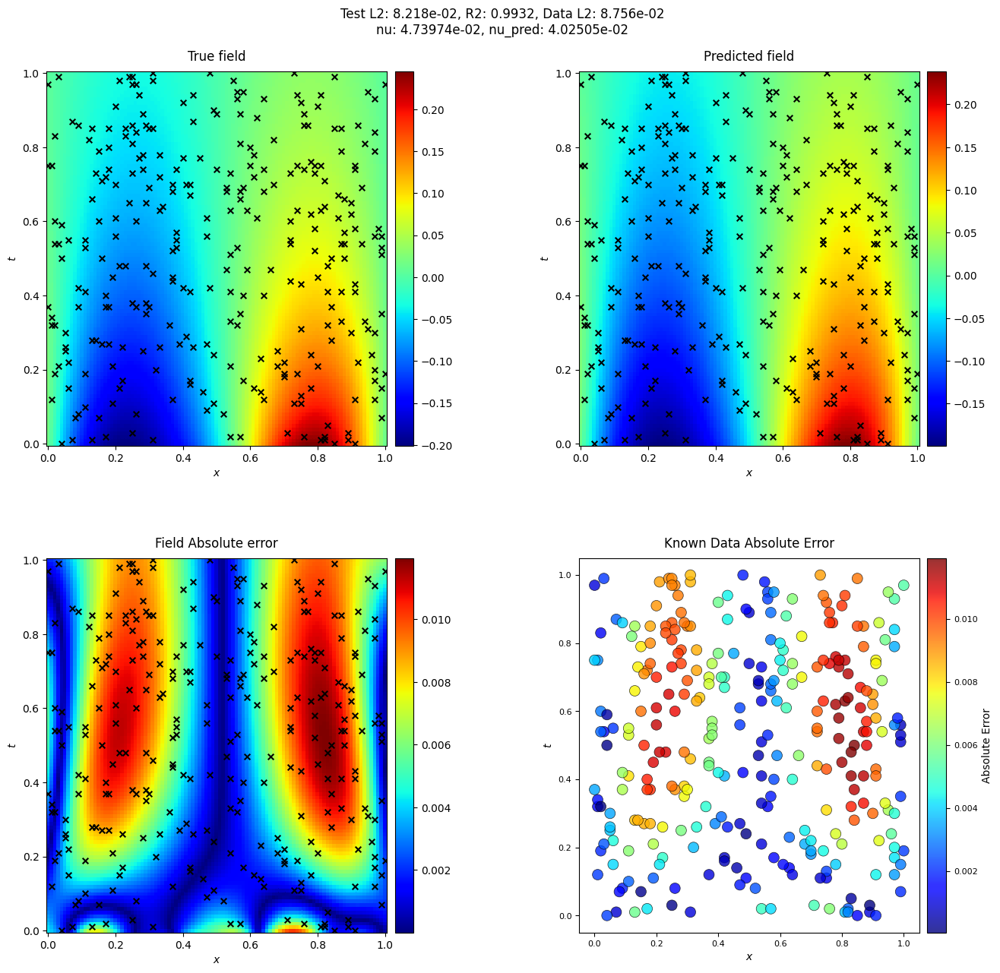

######################################################################################################################################################################################################################################
Visualizing test sample at index 30


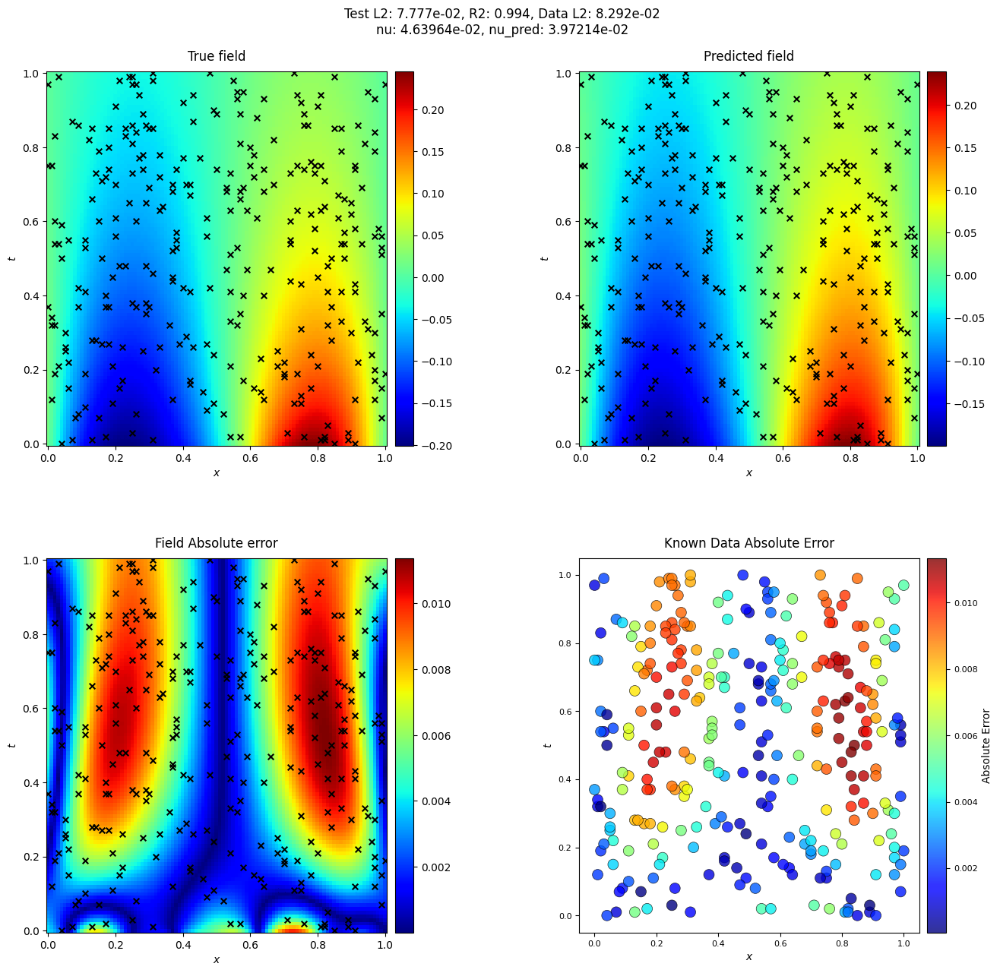

######################################################################################################################################################################################################################################
Visualizing test sample at index 40


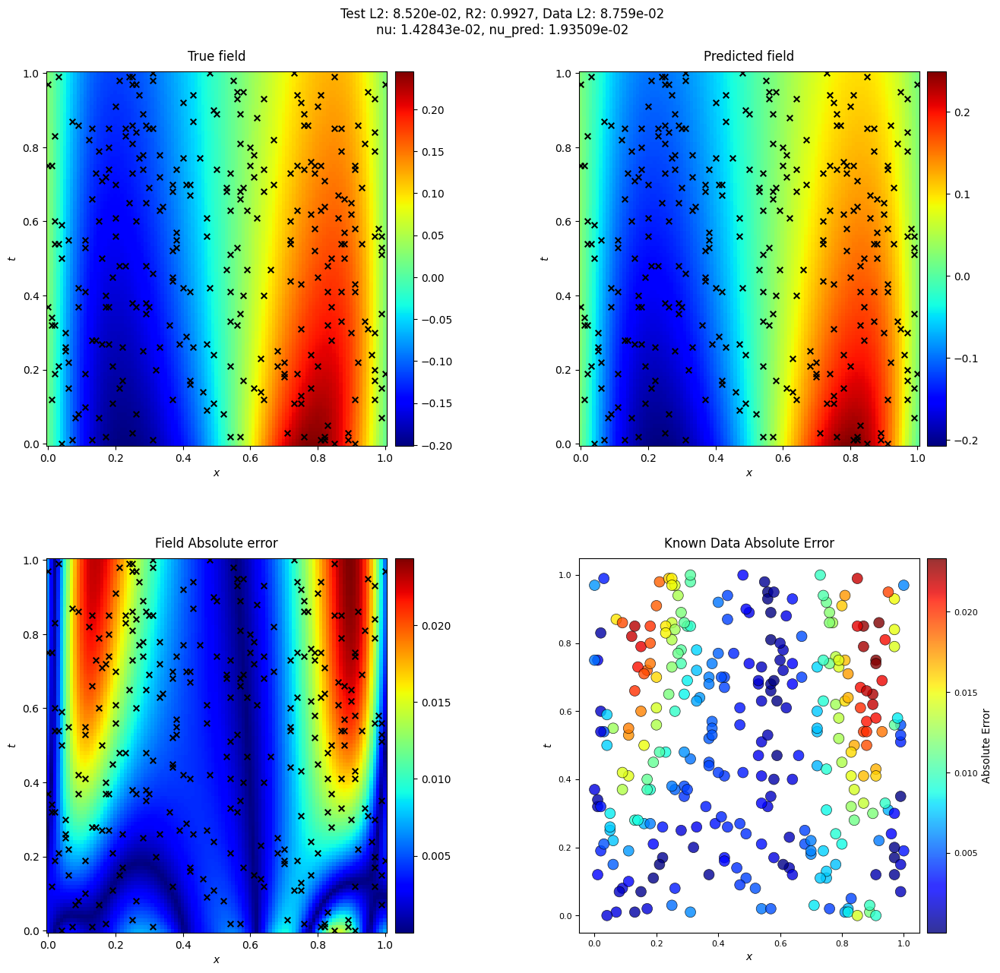

######################################################################################################################################################################################################################################
Visualizing test sample at index 50


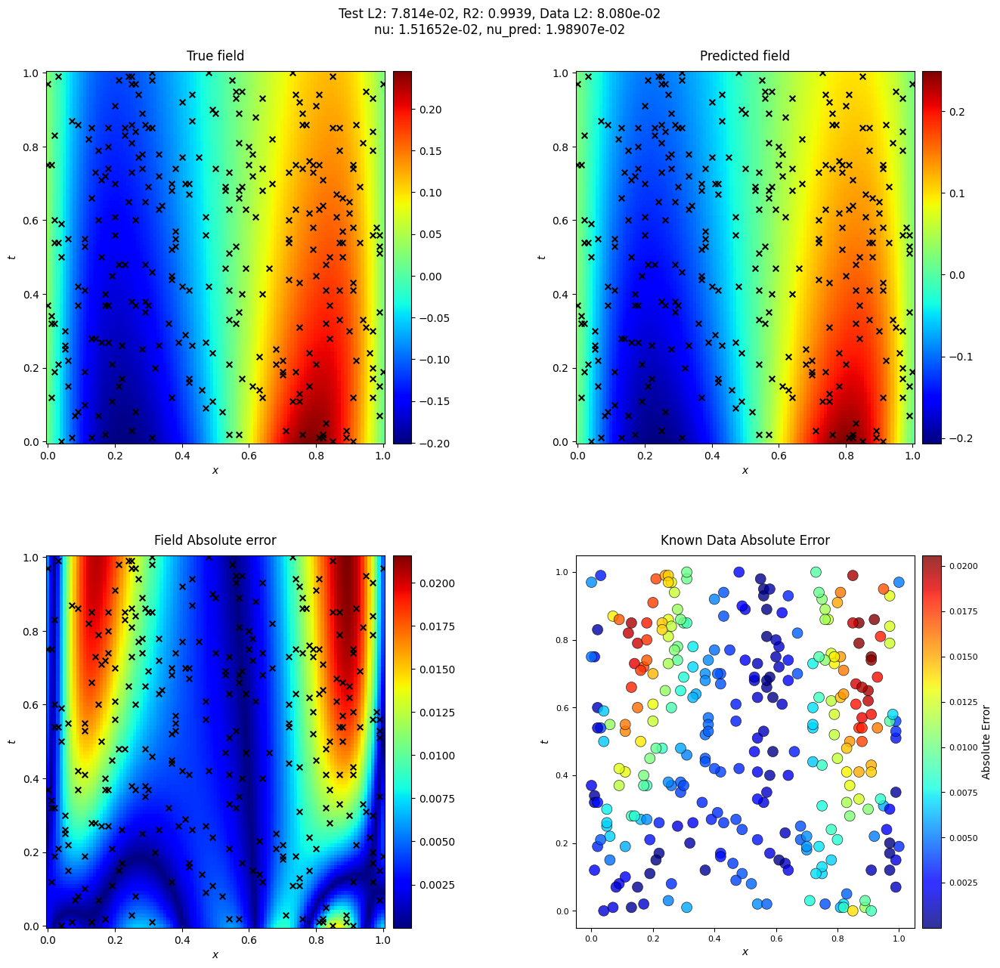

######################################################################################################################################################################################################################################
Visualizing test sample at index 60


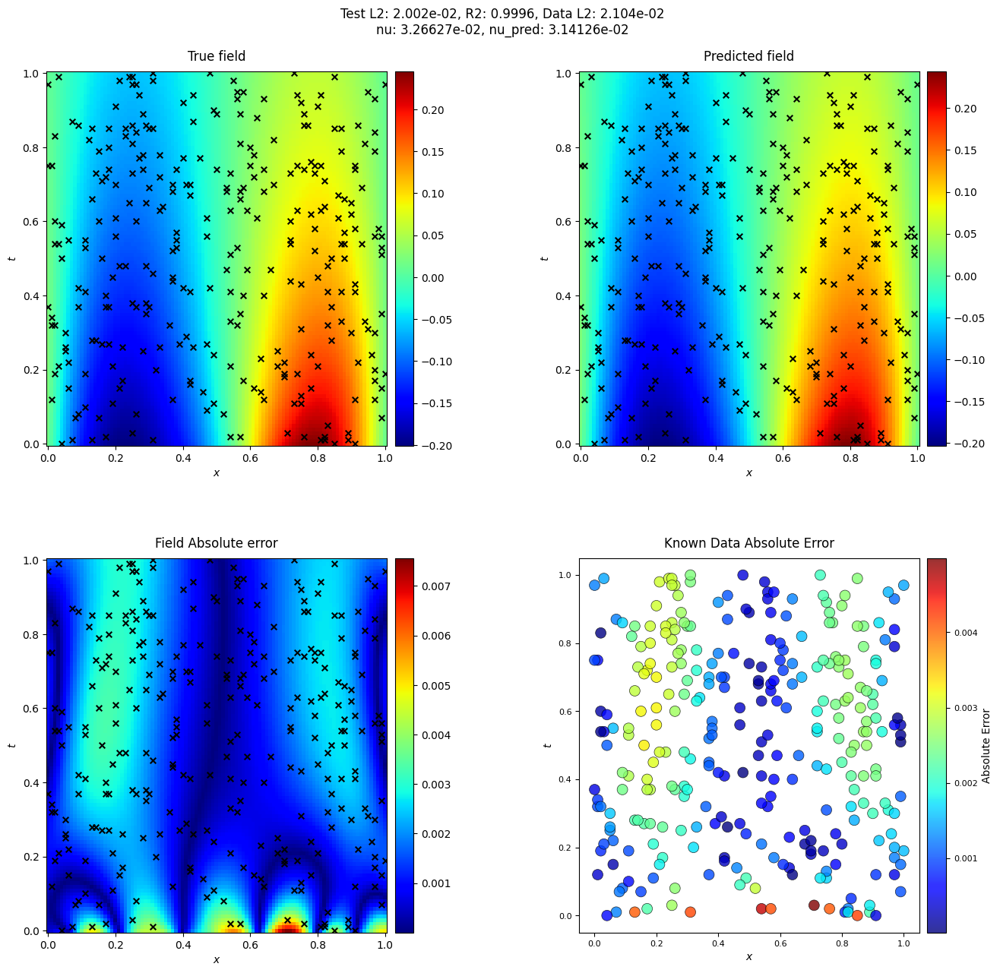

######################################################################################################################################################################################################################################
Visualizing test sample at index 70


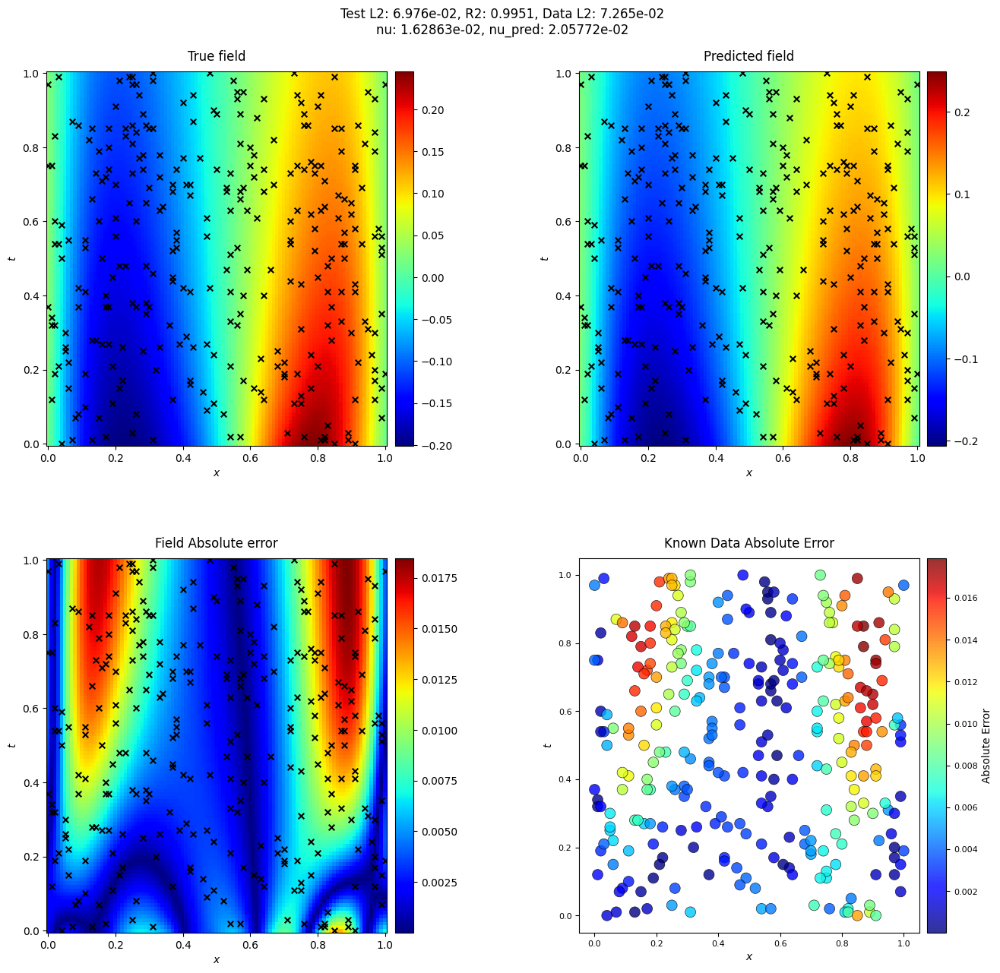

######################################################################################################################################################################################################################################
Visualizing test sample at index 80


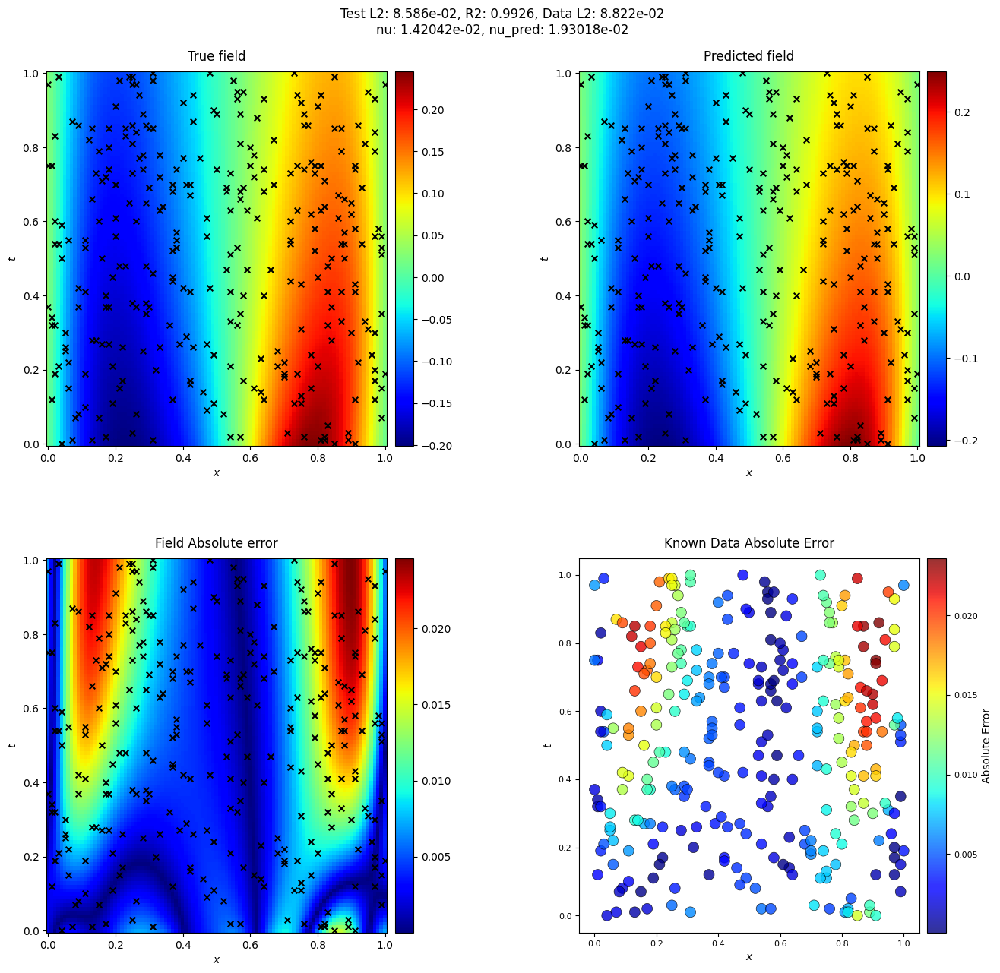

######################################################################################################################################################################################################################################
Visualizing test sample at index 90


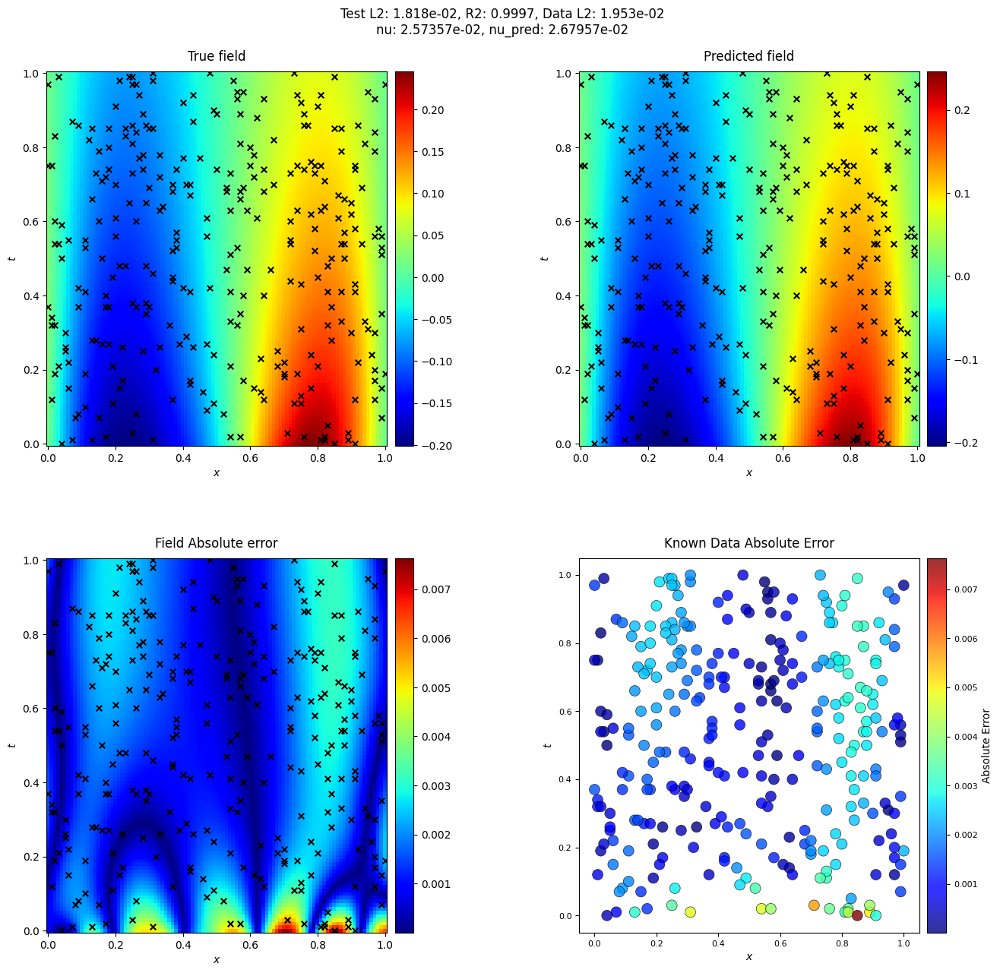

######################################################################################################################################################################################################################################
Mean MSE over train samples: 3.850e-05


In [54]:
"""# train visualization"""

def loss_test_l2_error_one_sample(model_fn, params_loaded, data_output, u_sol_test, idx, location_test, return_data=False):
    
    t_test = jnp.linspace(0, 1, u_sol_test.shape[1])
    x_test = jnp.linspace(0, 1, u_sol_test.shape[2])

    xx_test, tt_test = jnp.meshgrid(x_test, t_test, indexing='ij')

    y = jnp.stack([tt_test.flatten(), xx_test.flatten()], axis=-1) #(100*100, 2)

    t = y[:,0]
    x = y[:,1]

    data_output_i = data_output[idx, :]
    data_output_i = data_output_i[jnp.newaxis,:]
    
    def ff_net(t, x):
        s_pred = apply_net(model_fn, params_loaded, data_output_i, t, x)
        return s_pred

    s_pred = ff_net(t, x)

    s_pred = s_pred.reshape(u_sol_test.shape[1], u_sol_test.shape[2])

    loss_test = mse(u_sol_test[idx, :, :], s_pred)

    def l2_norm_error(a, b):
        """Calculate L2 norm error between two 2D arrays."""
        return jnp.linalg.norm(a - b)/jnp.linalg.norm(a)

    l2_error = jnp.mean(l2_norm_error(u_sol_test[idx,:,:], s_pred))

    # at known data (loactions)
    seed = 0
    key = jax.random.PRNGKey(seed)
    samples, ntt, nxx = u_sol_test.shape
    flattened_data = u_sol_test.reshape(samples, ntt * nxx)
    random_indices = jax.random.choice(key, ntt * nxx, shape=(300,), replace=False)
    t_indices = random_indices // ntt
    x_indices = random_indices % nxx
    
    s_pred_known_loc = s_pred[t_indices, x_indices]
    l2_error_data = jnp.mean(l2_norm_error(data_output[idx, :], s_pred_known_loc))
    
    if return_data:
        return loss_test, l2_error, s_pred, u_sol_test[idx,:,:], l2_error_data, s_pred_known_loc, data_output[idx, :]
    else:
        return loss_test, l2_error



def visualize_show(model_fn_nu, model_fn, params, result_dir, epoch, data_output, u_sol_test, nu_test, idx, location_test, test=False, save=False):
    params_loaded, params_nu = params
    loss_test, l2_error, s_pred, s_test, l2_error_data, s_pred_known_loc, s_known_data = loss_test_l2_error_one_sample(model_fn, params_loaded, data_output, u_sol_test, idx, location_test, return_data=True)
    
    nu_pred = apply_net_nu(model_fn_nu, params_nu, data_output)
    
    # Modify x and t to match the shapes of u and s_pred
    x = jnp.linspace(0, 1, s_pred.shape[1])
    t = jnp.linspace(0, 1, s_pred.shape[0])
    
    x_test, t_test = jnp.meshgrid(x, t, indexing='ij')

    # Calculate R² score
    r2_value = metrics.r2_score(s_test.flatten(), s_pred.flatten())
    r2_value = float('%.4f' % r2_value)

    # Create figure with 2x2 subplot layout
    fig = plt.figure(figsize=(16, 14))  # Increased height
    
    # Add the main title at the top with extra padding
    if test:
        title_text = f'Test L2: {l2_error:.3e}, R2: {r2_value}, Data L2: {l2_error_data:.3e}\nnu: {nu_test[idx]:.5e}, nu_pred: {nu_pred[idx]:.5e}'
    else:
        title_text = f'Train L2: {l2_error:.3e}, R2: {r2_value}'
    
    fig.suptitle(title_text, y=0.98, fontsize=12)
    
    # Create gridspec for better control over spacing
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1])
    gs.update(wspace=0.3, hspace=0.3)  # Increased spacing between plots

    # Plot 1: True field
    ax1 = plt.subplot(gs[0, 0])
    pcm1 = plt.pcolor(x_test, t_test, s_test.T, cmap='jet', shading='auto')
    cb1 = plt.colorbar(pcm1, ax=ax1, pad=0.02)
    plt.scatter(location_test[:,1], location_test[:,0], marker='x', s=30, color='black')
    ax1.set_xlabel(r'$x$')
    ax1.set_ylabel(r'$t$')
    ax1.set_title('True field', fontsize=12, pad=10)

    # Plot 2: Predicted field
    ax2 = plt.subplot(gs[0, 1])
    pcm2 = plt.pcolor(x_test, t_test, s_pred.T, cmap='jet', shading='auto')
    cb2 = plt.colorbar(pcm2, ax=ax2, pad=0.02)
    plt.scatter(location_test[:,1], location_test[:,0], marker='x', s=30, color='black')
    ax2.set_xlabel(r'$x$')
    ax2.set_ylabel(r'$t$')
    ax2.set_title('Predicted field', fontsize=12, pad=10)

    # Plot 3: Field Absolute error
    ax3 = plt.subplot(gs[1, 0])
    u_diff = s_test.T - s_pred.T
    pcm3 = plt.pcolor(x_test, t_test, jnp.abs(u_diff), cmap='jet', shading='auto')
    cb3 = plt.colorbar(pcm3, ax=ax3, pad=0.02)
    plt.scatter(location_test[:,1], location_test[:,0], marker='x', s=30, color='black')
    ax3.set_xlabel(r'$x$')
    ax3.set_ylabel(r'$t$')
    ax3.set_title('Field Absolute error', fontsize=12, pad=10)

    # Plot 4: Known data absolute error
    ax4 = plt.subplot(gs[1, 1])
    data_errors = jnp.abs(s_known_data - s_pred_known_loc)

    # Create scatter plot of the errors
    scatter = ax4.scatter(
        location_test[:, 1], location_test[:, 0], 
        c=data_errors, cmap='jet', 
        s=100, alpha=0.8, edgecolor='k', linewidth=0.5
    )

    # Add colorbar with label
    cb4 = plt.colorbar(scatter, ax=ax4, pad=0.02)
    cb4.set_label('Absolute Error', fontsize=10)
    cb4.ax.tick_params(labelsize=8)
    ax4.set_xlabel(r'$x$', fontsize=10)
    ax4.set_ylabel(r'$t$', fontsize=10)
    ax4.set_title('Known Data Absolute Error', fontsize=12, pad=10)
    ax4.tick_params(axis='both', which='major', labelsize=8)


    # Adjust layout to prevent overlapping
    plt.subplots_adjust(top=0.92)  # Make room for suptitle
    
    # Save if requested
    if save:
        plt.savefig(os.path.join(result_dir, f'Test_Sample_{idx+1}.pdf'), 
                   bbox_inches='tight', dpi=300)
    
    plt.show()
    plt.close()
    print(colored('#' * 230, 'green'))
    
    return r2_value

# Initialize an empty list to store MSE values
mse_values = []

# Load the best model parameters
filename='model_params_best.pkl'
# filename='model_params.pkl'


load_path = os.path.join(result_dir, filename)
with open(load_path, 'rb') as f:
    best_params = pickle.load(f)
        
# best_params = load_model_params(result_dir, filename='model_params_best.pkl')
print("Loaded best model parameters")


# Loop over every 20th index to visualize and calculate R²
for i in range(u_sol_test.shape[0]):
    if i % 10 == 0:
        idx = i
        print(f"Visualizing test sample at index {idx}")

        # Visualize and calculate R² score for every 20th index
        visualize_show(model_fn_nu, model_fn, best_params, result_dir, epochs, data_output_train, u_sol_train, nu_train, idx, location_train, True)

params_loaded, params_nu = best_params
# Calculate loss and l2 error for test samples
loss_test, l2_error = loss_test_l2_error(model_fn, params_loaded, data_output_train, u_sol_train, return_data=False)

# Calculate and print the mean MSE over all test samples
# mean_mse = jnp.mean(jnp.array(mse_values))
print(f"Mean MSE over train samples: {loss_test:.3e}")